# Epithelial Cell Annotation Pipeline - ENHANCED VERSION
## Quality-Controlled Cluster + GEP Analysis

**Enhancements in this version:**
- ✅ Small batch detection and flagging
- ✅ Low-usage GEP analysis (rare cell detection)
- ✅ High FC association validation
- ✅ Batch effect residual checking
- ✅ K value comparison (10, 15, 20)

**Data characteristics (from QC):**
- 278,930 cells, 29 clusters
- 22 batches (2 small batches: 166 & 679 cells)
- GEP usage: unbalanced (1-27% range)

---

## 📦 Setup and Data Loading

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage
from scipy import stats
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

sc.set_figure_params(dpi=100, frameon=False, figsize=(6, 6), facecolor='white')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300

print("✓ Libraries loaded")

✓ Libraries loaded


In [2]:
# ============================================================================
# CONFIGURATION
# ============================================================================

DATA_PATH = "/home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/output_complete_pipeline_v1/checkpoint_complete_with_geps.h5ad"
OUTPUT_DIR = "/home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/annotation_results"
CNMF_DIR = "/home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/output_complete_pipeline_v1/cnmf_results/Epithelial_HarmonyBatchCorrected"

import os
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Key columns
CLUSTER_KEY = 'leiden_bbknn'
TISSUE_KEY = 'tissue'
BATCH_KEY = 'dataset'

# GEP configuration
GEP_SUFFIX = 'harmony'
SELECTED_K = 15

# Quality control thresholds
SMALL_BATCH_THRESHOLD = 1000  # Flag batches < 1000 cells
LOW_USAGE_GEP_THRESHOLD = 0.02  # Flag GEPs with mean usage < 2%
HIGH_FC_THRESHOLD = 50  # Flag associations with FC > 50

print(f"✓ Configuration set")
print(f"   Data: {DATA_PATH}")
print(f"   Output: {OUTPUT_DIR}")

✓ Configuration set
   Data: /home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/output_complete_pipeline_v1/checkpoint_complete_with_geps.h5ad
   Output: /home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/annotation_results


In [3]:
# Load data
print("Loading data...")
adata = sc.read_h5ad(DATA_PATH)

print(f"\n✓ Data loaded")
print(f"   Cells: {adata.n_obs:,}")
print(f"   Genes: {adata.n_vars:,}")
print(f"   Clusters: {adata.obs[CLUSTER_KEY].nunique()}")
print(f"   Batches: {adata.obs[BATCH_KEY].nunique()}")

Loading data...

✓ Data loaded
   Cells: 278,930
   Genes: 53,973
   Clusters: 29
   Batches: 22


## 🔍 Enhanced Quality Control

### QC1: Small Batch Detection and Flagging

In [4]:
# Identify small batches
batch_counts = adata.obs[BATCH_KEY].value_counts()
small_batches = batch_counts[batch_counts < SMALL_BATCH_THRESHOLD].index.tolist()

print(f"Small batch analysis (threshold: {SMALL_BATCH_THRESHOLD} cells):")
print(f"\nFound {len(small_batches)} small batches:")
for batch in small_batches:
    n_cells = batch_counts[batch]
    pct = n_cells / adata.n_obs * 100
    print(f"  {batch}: {n_cells} cells ({pct:.3f}%)")

# Flag cells from small batches
adata.obs['from_small_batch'] = adata.obs[BATCH_KEY].isin(small_batches)
n_flagged = adata.obs['from_small_batch'].sum()
print(f"\n✓ Flagged {n_flagged:,} cells from small batches ({n_flagged/adata.n_obs*100:.2f}%)")

# Check cluster distribution of small batch cells
if n_flagged > 0:
    small_batch_cells = adata[adata.obs['from_small_batch']]
    cluster_dist = small_batch_cells.obs[CLUSTER_KEY].value_counts()
    
    print(f"\nSmall batch cells spread across {len(cluster_dist)} clusters")
    
    # Check if concentrated in specific clusters
    top5 = cluster_dist.head(5)
    top5_pct = top5.sum() / n_flagged * 100
    
    print(f"Top 5 clusters contain {top5_pct:.1f}% of small batch cells:")
    for cluster, count in top5.items():
        pct = count / n_flagged * 100
        print(f"  Cluster {cluster}: {count} cells ({pct:.1f}%)")
    
    if top5_pct > 70:
        print(f"\n⚠️  WARNING: Small batch cells highly concentrated in few clusters!")
        print(f"   These clusters may have batch-specific signals.")

Small batch analysis (threshold: 1000 cells):

Found 2 small batches:
  Lafyatis_Rojas_2019_10Xv2: 679 cells (0.243%)
  Lafyatis_Rojas_2019_10Xv1: 166 cells (0.060%)

✓ Flagged 845 cells from small batches (0.30%)

Small batch cells spread across 24 clusters
Top 5 clusters contain 84.6% of small batch cells:
  Cluster 8: 256 cells (30.3%)
  Cluster 25: 188 cells (22.2%)
  Cluster 14: 141 cells (16.7%)
  Cluster 28: 67 cells (7.9%)
  Cluster 4: 63 cells (7.5%)

⚠️  WARNING: Small batch cells highly concentrated in few clusters!
   These clusters may have batch-specific signals.


### QC2: Low-Usage GEP Analysis (Rare Cell Detection)

In [5]:
# Calculate GEP usage statistics
gep_cols = [f'GEP_{i}_{GEP_SUFFIX}' for i in range(1, SELECTED_K + 1)]
gep_usage_stats = adata.obs[gep_cols].agg(['mean', 'std', 'max'])

# Identify low-usage GEPs
low_usage_geps = gep_usage_stats.columns[gep_usage_stats.loc['mean'] < LOW_USAGE_GEP_THRESHOLD]

print(f"Low-usage GEP analysis (threshold: {LOW_USAGE_GEP_THRESHOLD*100:.0f}% mean usage):")
print(f"\nFound {len(low_usage_geps)} low-usage GEPs:")

low_gep_details = []
for gep in low_usage_geps:
    mean_usage = gep_usage_stats.loc['mean', gep]
    max_usage = gep_usage_stats.loc['max', gep]
    
    # Count cells with high usage
    high_usage_cells = (adata.obs[gep] > 0.15).sum()
    high_usage_pct = high_usage_cells / adata.n_obs * 100
    
    print(f"\n{gep}:")
    print(f"  Mean usage: {mean_usage:.3f}")
    print(f"  Max usage: {max_usage:.3f}")
    print(f"  Cells with >15% usage: {high_usage_cells} ({high_usage_pct:.3f}%)")
    
    # Find dominant clusters for this GEP
    if high_usage_cells > 10:
        high_cells = adata.obs[gep] > 0.15
        dominant_clusters = adata.obs[high_cells][CLUSTER_KEY].value_counts().head(3)
        print(f"  Main clusters: {dominant_clusters.to_dict()}")
        
        low_gep_details.append({
            'GEP': gep,
            'Mean_Usage': mean_usage,
            'High_Usage_Cells': high_usage_cells,
            'Main_Clusters': ', '.join(map(str, dominant_clusters.index.tolist()))
        })

if len(low_gep_details) > 0:
    low_gep_df = pd.DataFrame(low_gep_details)
    low_gep_df.to_csv(f"{OUTPUT_DIR}/low_usage_GEPs_analysis.csv", index=False)
    print(f"\n💡 These GEPs may represent rare cell types (Ionocyte, Tuft, etc.)")
    print(f"   Check their top genes for biological interpretation!")

Low-usage GEP analysis (threshold: 2% mean usage):

Found 4 low-usage GEPs:

GEP_12_harmony:
  Mean usage: 0.012
  Max usage: 1.000
  Cells with >15% usage: 2892 (1.037%)
  Main clusters: {'19': 2332, '11': 132, '21': 115}

GEP_13_harmony:
  Mean usage: 0.016
  Max usage: 1.000
  Cells with >15% usage: 4069 (1.459%)
  Main clusters: {'21': 2517, '26': 588, '2': 499}

GEP_14_harmony:
  Mean usage: 0.016
  Max usage: 1.000
  Cells with >15% usage: 5084 (1.823%)
  Main clusters: {'19': 4291, '22': 336, '16': 166}

GEP_15_harmony:
  Mean usage: 0.009
  Max usage: 1.000
  Cells with >15% usage: 2224 (0.797%)
  Main clusters: {'27': 1977, '0': 40, '5': 28}

💡 These GEPs may represent rare cell types (Ionocyte, Tuft, etc.)
   Check their top genes for biological interpretation!


### QC3: Batch Effect Residual Check

In [6]:
# Check if any cluster is dominated by a single batch
print("Checking for batch-dominated clusters...\n")

batch_dominated_clusters = []

for cluster in adata.obs[CLUSTER_KEY].unique():
    cluster_cells = adata[adata.obs[CLUSTER_KEY] == cluster]
    n_cluster = len(cluster_cells)
    
    # Get batch distribution in this cluster
    batch_dist = cluster_cells.obs[BATCH_KEY].value_counts()
    dominant_batch = batch_dist.index[0]
    dominant_count = batch_dist.values[0]
    dominant_pct = dominant_count / n_cluster * 100
    
    # Flag if >70% from single batch
    if dominant_pct > 70:
        batch_dominated_clusters.append({
            'Cluster': cluster,
            'Size': n_cluster,
            'Dominant_Batch': dominant_batch,
            'Dominant_Pct': dominant_pct,
            'N_Batches': len(batch_dist)
        })

if len(batch_dominated_clusters) > 0:
    batch_dom_df = pd.DataFrame(batch_dominated_clusters)
    batch_dom_df = batch_dom_df.sort_values('Dominant_Pct', ascending=False)
    
    print(f"⚠️  Found {len(batch_dominated_clusters)} batch-dominated clusters (>70% from one batch):\n")
    print(batch_dom_df.to_string(index=False))
    
    batch_dom_df.to_csv(f"{OUTPUT_DIR}/batch_dominated_clusters.csv", index=False)
    
    print(f"\n💡 These clusters may have batch-specific signals.")
    print(f"   Verify with marker genes and cross-batch validation!")
else:
    print("✅ No severely batch-dominated clusters found.")
    print("   Batch correction appears effective.")

Checking for batch-dominated clusters...

⚠️  Found 1 batch-dominated clusters (>70% from one batch):

Cluster  Size    Dominant_Batch  Dominant_Pct  N_Batches
     23  3771 Weiqing_Wang_2022     97.295147         15

💡 These clusters may have batch-specific signals.
   Verify with marker genes and cross-batch validation!


## 🧬 Comprehensive Marker Genes

In [7]:
# Full marker gene dictionary (from your uploaded image)
MARKER_GENES = {
    # Alveolar cells
    'AT1': ['AGER', 'CAV1', 'MYL9', 'SFTA2', 'CLIC3', 'SPOCK2', 'ANXA3', 'RTKN2', 'TIMP3', 'TNNC1'],
    'AT2': ['SFTPB', 'SFTPC', 'SFTPA1', 'SFTPA2', 'LAMP3', 'LRRK2', 'TFPI', 'MFSD2A', 'SERPINA1'],
    'AT2_proliferating': ['STMN1', 'SFTPA2', 'SFTPA1', 'TYMS', 'TK1', 'PTTG1', 'KIAA0101', 'TOP2A', 'CENPW', 'DTYMK'],
    'Transitional_Club_AT2': ['SCGB3A2', 'MGP', 'C16orf89', 'SFTA1P', 'VIM', 'SFTPA2', 'CAV1', 'ICAM1', 'SUSD2'],
    
    # Basal cells
    'Basal_resting': ['KRT15', 'KRT17', 'KRT5', 'DST', 'DLK2', 'IL33', 'FHL2', 'PTPRZ1'],
    'Suprabasal': ['KRT5', 'KRT17', 'SERPINB4', 'SERPINB13', 'KRT6A', 'CLCA2', 'LY6D', 'PPP1R14B', 'AKR1C3', 'IGFBP3'],
    'Basal_general': ['TP63', 'KRT5', 'KRT14'],
    
    # Ciliated cells
    'Deuterosomal': ['CCNO', 'CDC20B', 'ZMYND10', 'KIF9', 'FOXJ1', 'HES6', 'CEP78', 'TMEM106C', 'CCDC67', 'KDELC2'],
    'Multiciliated_nasal': ['C20orf85', 'C9orf24', 'RSPH1', 'PIFO', 'RP11-356K23.1', 'CCDC80', 'PROM1', 'OMG', 'DIAPH2', 'C15orf48'],
    'Multiciliated_non_nasal': ['C20orf85', 'CAPS', 'C9orf24', 'RSPH1', 'FAM183A', 'MS4A8', 'TFF3', 'IGFBP5', 'CFAP43', 'C2orf40'],
    'Ciliated_general': ['FOXJ1', 'RSPH1', 'PIFO'],
    
    # Club/Secretory cells
    'Club_non_nasal': ['TSPAN8', 'CYP2F1', 'TFF3', 'TGM2', 'MUC5B', 'CXCL6', 'C16orf89', 'HES4', 'RHOV', 'KIAA1324'],
    'Club_nasal': ['ASRGL1', 'LYPD2', 'UGT2A1', 'TFCP2L1', 'LY6D', 'TPD52L1', 'SORD', 'PI3'],
    'Secretory_general': ['SCGB1A1', 'SCGB3A2', 'SERPINB3'],
    
    # Goblet cells
    'Goblet_nasal': ['LYPD2', 'PI3', 'CEACAM5', 'LYNX1', 'MUC5AC', 'MUC16', 'C15orf48', 'BPIFA1', 'CCDC80', 'DHRS9'],
    'Goblet_bronchial': ['MUC5B', 'RARRES1', 'SAA1', 'ANKRD36C', 'SAA2', 'LYZ', 'PLCG2', 'FCGBP', 'RIMS1', 'MUC5AC'],
    'Goblet_subegmental': ['TSPAN8', 'MUC5B', 'C16orf89', 'MTRNR2L10', 'CLCA2', 'CFD', 'KIAA1324', 'LTF', 'TMEM45A', 'FCGBP'],
    'Goblet_general': ['MUC5AC', 'SPDEF', 'LYPD2', 'ITLN1'],
    
    # SMG cells
    'SMG_serous_nasal': ['LYZ', 'ZG16B', 'AZGP1', 'LTF', 'STATH', 'PIP', 'CLDN10', 'GJC3', 'ODAM', 'S100A1'],
    'SMG_serous_bronchial': ['LYZ', 'LTF', 'PRR4', 'AZGP1', 'S100A1', 'APIP', 'RP11-1143G9.4', 'PRB3', 'AC078941.1', 'C6orf58'],
    'SMG_mucous': ['MUC5B', 'BPIFB2', 'AZGP1', 'FCGBP', 'NKX3-1', 'TSPAN8', 'TFF1', 'DEFB1', 'HMGCS2', 'CRYM'],
    'SMG_duct': ['RARRES1', 'TCN1', 'SAA1', 'MIA', 'DMBT1', 'SAA2', 'RHOV', 'MMP7', 'ALDH1A3', 'ANKRD36C'],
    
    # Rare cells
    'Ionocyte': ['RARRES2', 'TMEM61', 'ASCL3', 'SCNN1B', 'STAP1', 'ATP6V1A', 'CFTR', 'HEPACAM2', 'CLCNKB', 'FOXI1'],
    'Tuft': ['STMN1', 'MARCKSL1', 'RASSF6', 'CRYM', 'HES6', 'KIT', 'AZGP1', 'HOMER3', 'NREP', 'LRMP'],
    'Neuroendocrine': ['PCSK1N', 'GRP', 'CPE', 'ASCL1', 'CHGA', 'SCG2', 'SCG5', 'SYT1', 'SCG3', 'SCGN'],
    
    # Proliferation
    'Proliferating': ['MKI67', 'TOP2A', 'TK1', 'CENPW', 'STMN1'],
}

ALL_MARKERS = sorted(set([gene for genes in MARKER_GENES.values() for gene in genes]))
available_markers = [m for m in ALL_MARKERS if m in adata.var_names]

print(f"Marker genes:")
print(f"  Total defined: {len(ALL_MARKERS)}")
print(f"  Available: {len(available_markers)} ({len(available_markers)/len(ALL_MARKERS)*100:.1f}%)")

Marker genes:
  Total defined: 168
  Available: 168 (100.0%)


---
## 📊 Round 1: Core Visualizations

### 1.1 UMAP Overview with QC Flags

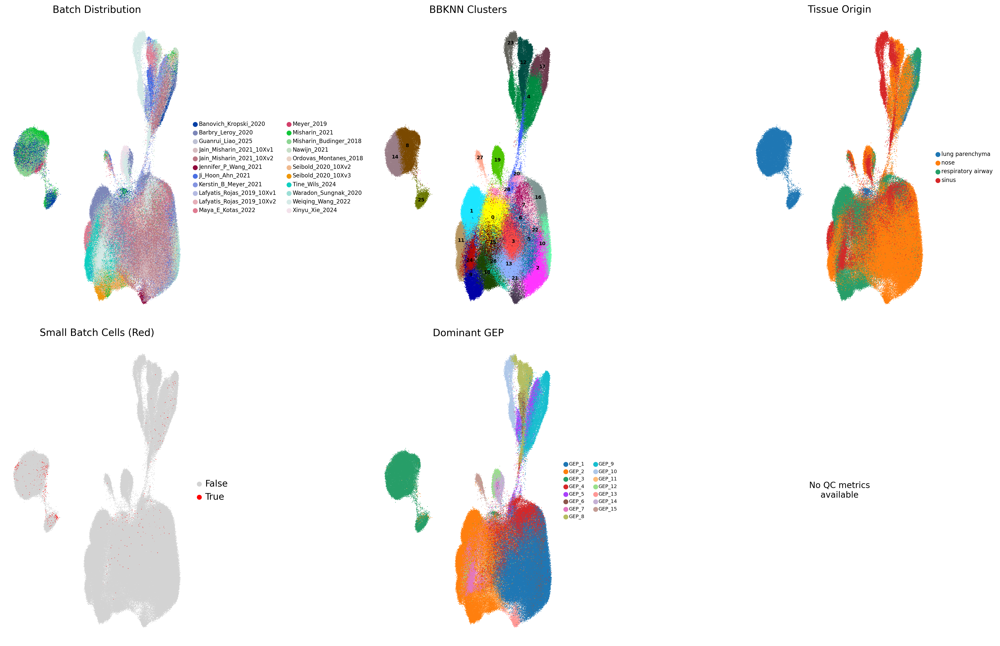

✓ Enhanced UMAP overview saved


In [8]:
# ============================================================================
# Enhanced UMAP with small batch highlighting
# ============================================================================

# Convert boolean to categorical for plotting
adata.obs['from_small_batch_cat'] = adata.obs['from_small_batch'].astype(str).astype('category')

fig, axes = plt.subplots(2, 3, figsize=(20, 13))

# Panel 1: Batch distribution
sc.pl.umap(adata, color=BATCH_KEY, ax=axes[0, 0], show=False, 
           title='Batch Distribution', frameon=False, legend_fontsize=8, s=3)

# Panel 2: Clusters
sc.pl.umap(adata, color=CLUSTER_KEY, ax=axes[0, 1], show=False,
           title='BBKNN Clusters', frameon=False, 
           legend_loc='on data', legend_fontsize=7, s=3)

# Panel 3: Tissue origin
sc.pl.umap(adata, color=TISSUE_KEY, ax=axes[0, 2], show=False,
           title='Tissue Origin', frameon=False, legend_fontsize=8, s=3)

# Panel 4: Small batch cells (FIXED - now uses categorical)
sc.pl.umap(adata, color='from_small_batch_cat', ax=axes[1, 0], show=False,
           title='Small Batch Cells (Red)', frameon=False, s=3,
           palette={'False': 'lightgray', 'True': 'red'})

# Panel 5: Dominant GEP
gep_cols_short = [f'GEP_{i}_{GEP_SUFFIX}' for i in range(1, SELECTED_K + 1)]
adata.obs['dominant_GEP'] = adata.obs[gep_cols_short].idxmax(axis=1).str.replace(f'_{GEP_SUFFIX}', '')
sc.pl.umap(adata, color='dominant_GEP', ax=axes[1, 1], show=False,
           title='Dominant GEP', frameon=False, legend_fontsize=7, s=3)

# Panel 6: UMI counts (if available)
if 'n_counts' in adata.obs.columns:
    sc.pl.umap(adata, color='n_counts', ax=axes[1, 2], show=False,
               title='UMI Counts', frameon=False, cmap='viridis', s=3)
elif 'total_counts' in adata.obs.columns:
    sc.pl.umap(adata, color='total_counts', ax=axes[1, 2], show=False,
               title='Total Counts', frameon=False, cmap='viridis', s=3)
else:
    axes[1, 2].text(0.5, 0.5, 'No QC metrics\navailable', 
                    ha='center', va='center', fontsize=12)
    axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/01_UMAP_overview_enhanced.png", dpi=300, bbox_inches='tight')
plt.show()

print("✓ Enhanced UMAP overview saved")

### 1.2 GEP-Cluster Heatmap with Annotations

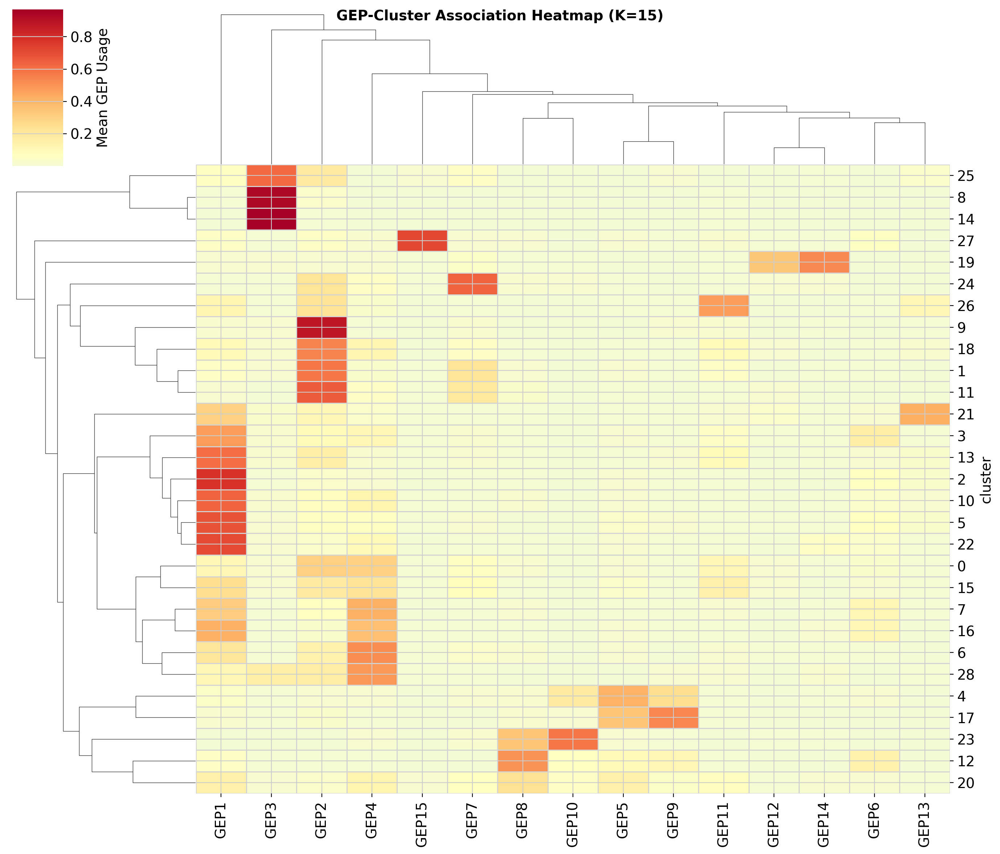

✓ GEP-Cluster heatmap saved


In [9]:
# Calculate GEP usage per cluster
gep_usage = adata.obs[gep_cols_short + [CLUSTER_KEY]].copy()
gep_usage.columns = [f'GEP{i}' for i in range(1, SELECTED_K + 1)] + ['cluster']
mean_usage = gep_usage.groupby('cluster').mean()

# Add annotations: cluster size and batch diversity
cluster_annotations = []
for cluster in mean_usage.index:
    cluster_cells = adata[adata.obs[CLUSTER_KEY] == cluster]
    n_cells = len(cluster_cells)
    n_batches = cluster_cells.obs[BATCH_KEY].nunique()
    small_batch_pct = (cluster_cells.obs['from_small_batch'].sum() / n_cells * 100)
    
    cluster_annotations.append({
        'Cluster': cluster,
        'Size': n_cells,
        'N_Batches': n_batches,
        'Small_Batch_Pct': small_batch_pct
    })

cluster_anno_df = pd.DataFrame(cluster_annotations).set_index('Cluster')

# Create enhanced clustermap
row_linkage = linkage(mean_usage.values, method='average')
col_linkage = linkage(mean_usage.T.values, method='average')

fig_width = max(14, SELECTED_K * 0.7)
fig_height = max(12, len(mean_usage) * 0.35)

g = sns.clustermap(
    mean_usage,
    row_linkage=row_linkage,
    col_linkage=col_linkage,
    cmap='RdYlBu_r',
    center=mean_usage.values.mean(),
    figsize=(fig_width, fig_height),
    cbar_kws={'label': 'Mean GEP Usage'},
    linewidths=0.5,
    linecolor='lightgray',
    yticklabels=True,
    xticklabels=True
)

plt.suptitle(f'GEP-Cluster Association Heatmap (K={SELECTED_K})', 
             y=0.98, fontsize=14, fontweight='bold')
plt.savefig(f"{OUTPUT_DIR}/02_GEP_cluster_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()

# Save data
mean_usage.to_csv(f"{OUTPUT_DIR}/GEP_cluster_mean_usage.csv")
cluster_anno_df.to_csv(f"{OUTPUT_DIR}/cluster_annotations.csv")

print("✓ GEP-Cluster heatmap saved")

### 1.3 Low-Usage GEP Visualization (Rare Cell Focus)

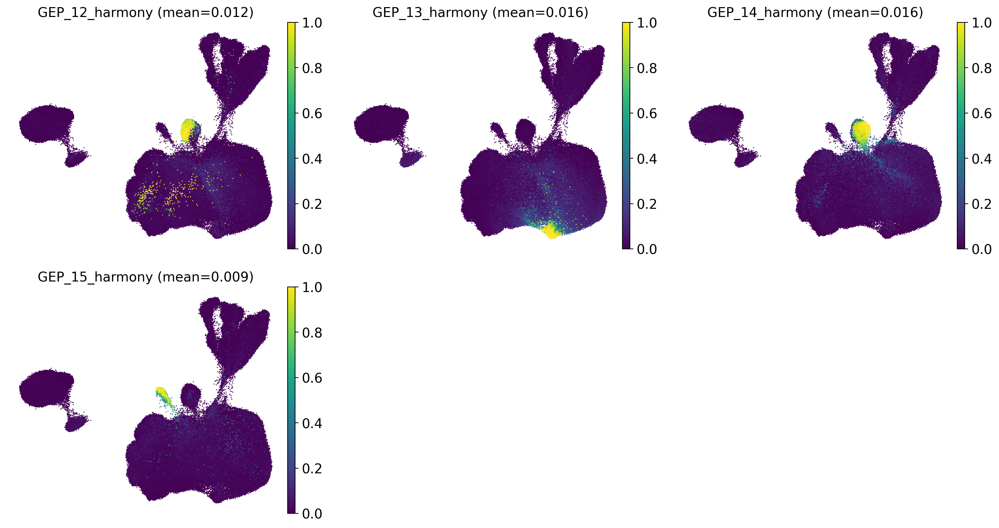

✓ Low-usage GEP visualization saved

💡 These GEPs likely represent rare cell types:
   Check if they correspond to Ionocyte, Tuft, or Neuroendocrine markers!


In [10]:
# Visualize low-usage GEPs on UMAP
if len(low_usage_geps) > 0:
    n_low_geps = len(low_usage_geps)
    ncols = 3
    nrows = (n_low_geps + ncols - 1) // ncols
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows*4))
    axes = axes.flatten() if n_low_geps > 1 else [axes]
    
    for idx, gep in enumerate(low_usage_geps):
        sc.pl.umap(adata, color=gep, ax=axes[idx], show=False,
                   title=f"{gep} (mean={gep_usage_stats.loc['mean', gep]:.3f})",
                   cmap='viridis', frameon=False, s=5)
    
    # Hide extra axes
    for idx in range(n_low_geps, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/03_low_usage_GEPs_umap.png", dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✓ Low-usage GEP visualization saved")
    print(f"\n💡 These GEPs likely represent rare cell types:")
    print(f"   Check if they correspond to Ionocyte, Tuft, or Neuroendocrine markers!")
else:
    print("No low-usage GEPs detected.")

### 1.4 Marker Gene Dotplot

Dotplot genes: 40 available
Computing dendrogram...
Creating dotplot with dendrogram...


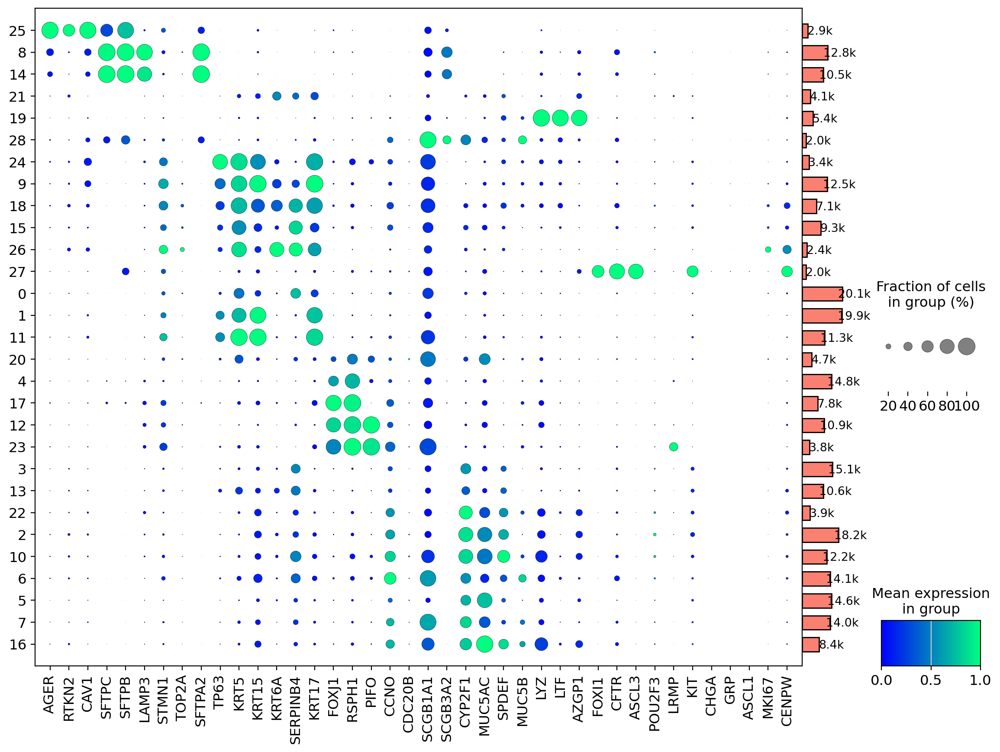

✓ Marker dotplot with dendrogram saved


In [11]:
# ============================================================================
# Marker Gene Dotplot with Dendrogram
# ============================================================================

# Curated marker list for dotplot
dotplot_markers = {
    'AT1': ['AGER', 'RTKN2', 'CAV1'],
    'AT2': ['SFTPC', 'SFTPB', 'LAMP3'],
    'AT2_prolif': ['STMN1', 'TOP2A', 'SFTPA2'],
    'Basal': ['TP63', 'KRT5', 'KRT15'],
    'Suprabasal': ['KRT6A', 'SERPINB4', 'KRT17'],
    'Ciliated': ['FOXJ1', 'RSPH1', 'PIFO'],
    'Deuterosomal': ['CCNO', 'CDC20B', 'FOXJ1'],
    'Club': ['SCGB1A1', 'SCGB3A2', 'CYP2F1'],
    'Goblet': ['MUC5AC', 'SPDEF', 'MUC5B'],
    'SMG': ['LYZ', 'LTF', 'AZGP1'],
    'Ionocyte': ['FOXI1', 'CFTR', 'ASCL3'],
    'Tuft': ['POU2F3', 'LRMP', 'KIT'],
    'NE': ['CHGA', 'GRP', 'ASCL1'],
    'Prolif': ['MKI67', 'TOP2A', 'CENPW'],
}

# Collect available genes
dotplot_genes = []
for genes in dotplot_markers.values():
    available = [g for g in genes if g in adata.var_names]
    dotplot_genes.extend(available)
# Remove duplicates while preserving order
dotplot_genes = list(dict.fromkeys(dotplot_genes))

print(f"Dotplot genes: {len(dotplot_genes)} available")

# Calculate figure size
n_clusters = adata.obs[CLUSTER_KEY].nunique()
fig_height = max(10, n_clusters * 0.3)
fig_width = max(12, len(dotplot_genes) * 0.35)

# Pre-compute dendrogram
print("Computing dendrogram...")
sc.tl.dendrogram(adata, groupby=CLUSTER_KEY)

# Create dotplot object with dendrogram
from scanpy.plotting import DotPlot

print("Creating dotplot with dendrogram...")
dp = DotPlot(
    adata,
    var_names=dotplot_genes,
    groupby=CLUSTER_KEY,
    standard_scale='var',
    figsize=(fig_width, fig_height)
)

# Add dendrogram (this will show the tree on the left)
dp = dp.add_dendrogram(size=1.5)

# Add totals (optional, shows number of cells per cluster)
dp = dp.add_totals()

# Generate the plot
dp.make_figure()

# Save
plt.savefig(f"{OUTPUT_DIR}/04_marker_dotplot.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

print("✓ Marker dotplot with dendrogram saved")

---
## 🔬 Round 2: Deep Analysis

### 2.1 Cluster Category Signatures

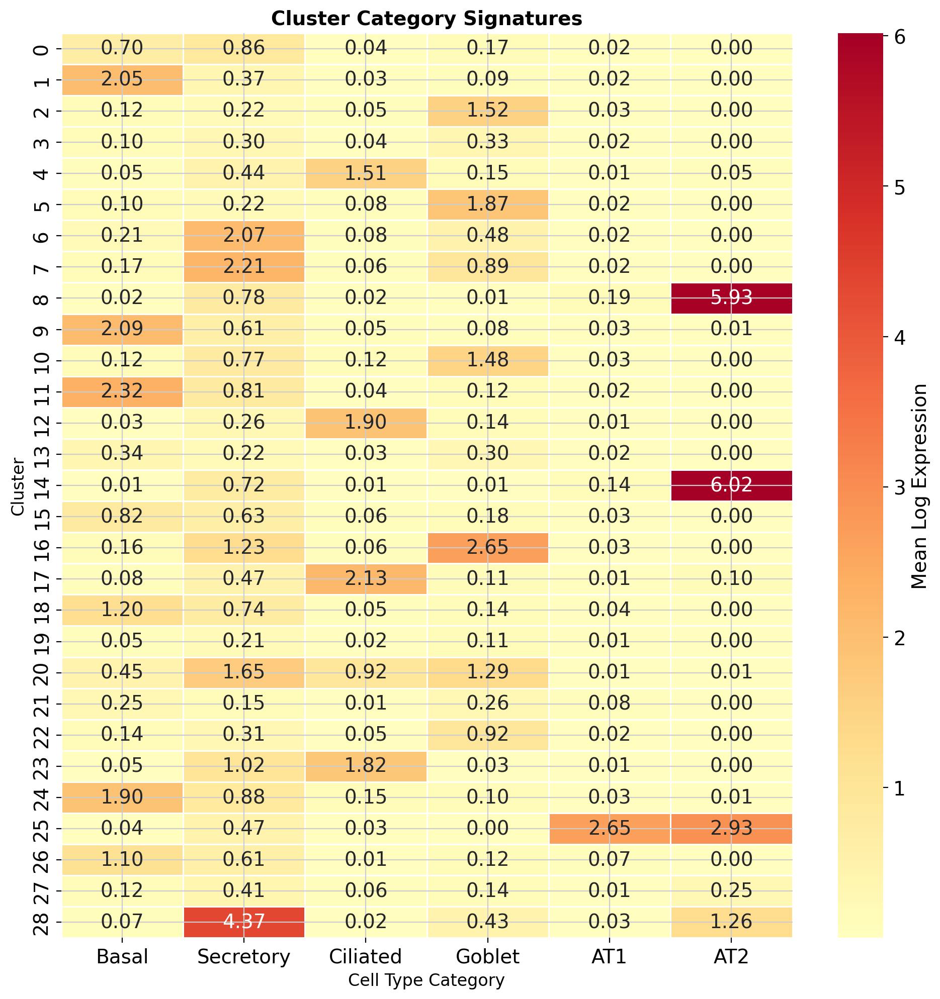

✓ Cluster signatures saved


In [12]:
# Calculate marker expression per cluster
marker_categories = {
    'Basal': ['TP63', 'KRT5', 'KRT15'],
    'Secretory': ['SCGB1A1', 'SCGB3A2'],
    'Ciliated': ['FOXJ1', 'RSPH1'],
    'Goblet': ['MUC5AC', 'SPDEF'],
    'AT1': ['AGER', 'RTKN2'],
    'AT2': ['SFTPC', 'SFTPB'],
}

cluster_signatures = {}

for cat_name, markers in marker_categories.items():
    available_markers = [m for m in markers if m in adata.var_names]
    if len(available_markers) == 0:
        continue
    
    if 'log1p' in adata.layers:
        expr_data = pd.DataFrame(
            adata[:, available_markers].layers['log1p'].toarray() 
            if hasattr(adata[:, available_markers].layers['log1p'], 'toarray') 
            else adata[:, available_markers].layers['log1p'],
            index=adata.obs_names,
            columns=available_markers
        )
    else:
        expr_data = pd.DataFrame(
            adata[:, available_markers].X.toarray() 
            if hasattr(adata[:, available_markers].X, 'toarray') 
            else adata[:, available_markers].X,
            index=adata.obs_names,
            columns=available_markers
        )
    
    expr_data['cluster'] = adata.obs[CLUSTER_KEY].values
    mean_expr = expr_data.groupby('cluster').mean().mean(axis=1)
    cluster_signatures[cat_name] = mean_expr

signature_df = pd.DataFrame(cluster_signatures)
signature_df.to_csv(f"{OUTPUT_DIR}/cluster_category_signatures.csv")

# Visualize
plt.figure(figsize=(10, max(10, n_clusters * 0.35)))
sns.heatmap(
    signature_df,
    cmap='RdYlBu_r',
    center=0,
    annot=True,
    fmt='.2f',
    cbar_kws={'label': 'Mean Log Expression'},
    linewidths=0.5
)
plt.title('Cluster Category Signatures', fontsize=14, fontweight='bold')
plt.xlabel('Cell Type Category', fontsize=12)
plt.ylabel('Cluster', fontsize=12)
plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/05_cluster_signatures.png", dpi=300, bbox_inches='tight')
plt.show()

print("✓ Cluster signatures saved")

### 2.2 GEP Top Genes Analysis

In [13]:
# Load gene spectra
import glob

spectra_file = f"{CNMF_DIR}/Epithelial_HarmonyBatchCorrected.gene_spectra_score.k_{SELECTED_K}.dt_0_1.txt"

if os.path.exists(spectra_file):
    gene_spectra = pd.read_csv(spectra_file, sep='\t', index_col=0)
    
    TOP_N_GENES = 30
    gep_top_genes = {}
    
    for col in gene_spectra.columns:
        top_genes = gene_spectra[col].sort_values(ascending=False).head(TOP_N_GENES)
        gep_top_genes[col] = top_genes.index.tolist()
    
    # Save to file
    with open(f"{OUTPUT_DIR}/GEP_top_genes.txt", 'w') as f:
        for gep, genes in gep_top_genes.items():
            f.write(f"\n{'='*60}\n")
            f.write(f"{gep} - Top {TOP_N_GENES} Genes\n")
            f.write(f"{'='*60}\n")
            for i, gene in enumerate(genes, 1):
                f.write(f"{i:2d}. {gene}\n")
    
    print(f"✓ GEP top genes saved")
    
    # Display low-usage GEPs top genes
    if len(low_usage_geps) > 0:
        print(f"\nTop genes for low-usage GEPs (likely rare cells):\n")
        for gep in low_usage_geps:
            gep_num = gep.replace(f'GEP_', '').replace(f'_{GEP_SUFFIX}', '')
            col_name = str(gep_num)
            if col_name in gep_top_genes:
                print(f"{gep} top 10:")
                print(f"  {', '.join(gep_top_genes[col_name][:10])}")
                print()
else:
    print(f"⚠️  Gene spectra file not found: {spectra_file}")

✓ GEP top genes saved

Top genes for low-usage GEPs (likely rare cells):



### 2.3 Tissue Composition Analysis

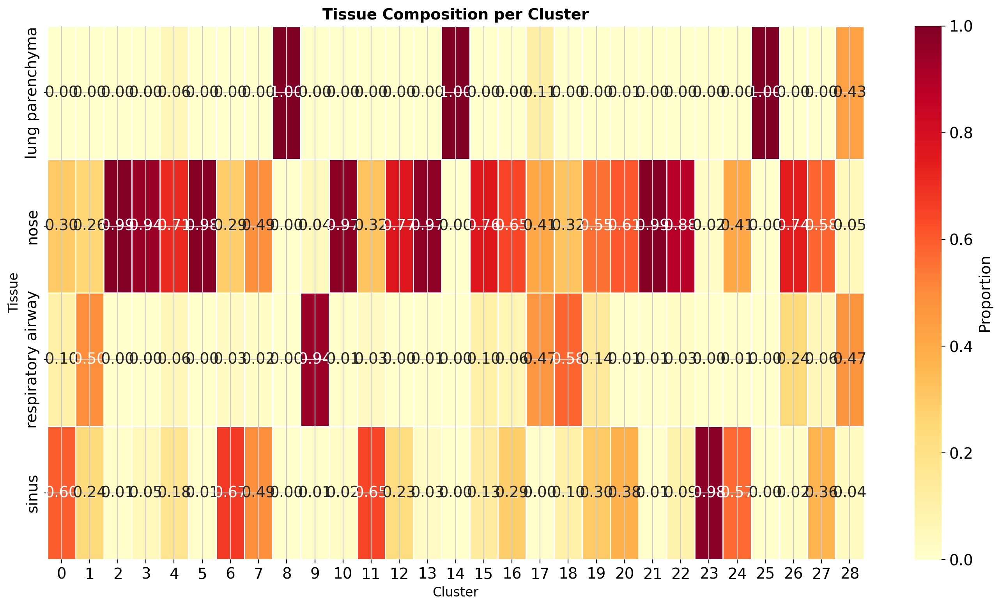

✓ Tissue composition analysis saved


In [14]:
# Tissue × Cluster contingency table
tissue_cluster = pd.crosstab(
    adata.obs[TISSUE_KEY],
    adata.obs[CLUSTER_KEY],
    normalize='columns'
)

plt.figure(figsize=(max(14, n_clusters * 0.45), 8))
sns.heatmap(
    tissue_cluster,
    cmap='YlOrRd',
    annot=True,
    fmt='.2f',
    cbar_kws={'label': 'Proportion'},
    linewidths=0.5
)
plt.title('Tissue Composition per Cluster', fontsize=14, fontweight='bold')
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Tissue', fontsize=12)
plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/06_tissue_cluster_composition.png", dpi=300, bbox_inches='tight')
plt.show()

tissue_cluster.to_csv(f"{OUTPUT_DIR}/tissue_cluster_composition.csv")
print("✓ Tissue composition analysis saved")

---
## 💡 Round 3: Annotation Suggestions

### 3.1 Automated Suggestions with QC Flags

In [15]:
# Generate annotation suggestions
annotation_suggestions = []

for cluster in signature_df.index:
    scores = signature_df.loc[cluster]
    top_category = scores.idxmax()
    top_score = scores.max()
    second_category = scores.nlargest(2).index[1]
    second_score = scores.nlargest(2).values[1]
    
    # Determine confidence
    if top_score > 1.5 and (top_score - second_score) > 0.5:
        confidence = 'High'
        suggestion = top_category
    elif top_score > 1.0:
        confidence = 'Moderate'
        suggestion = f"{top_category}/{second_category}" if second_score > 0.8 else top_category
    else:
        confidence = 'Low'
        suggestion = f"Unknown ({top_category}?)"
    
    cluster_size = (adata.obs[CLUSTER_KEY] == cluster).sum()
    
    # Get dominant GEP
    cluster_gep_usage = mean_usage.loc[cluster]
    dominant_gep = cluster_gep_usage.idxmax()
    dominant_gep_usage = cluster_gep_usage.max()
    
    # Get QC flags
    cluster_anno = cluster_anno_df.loc[cluster]
    small_batch_pct = cluster_anno['Small_Batch_Pct']
    n_batches = cluster_anno['N_Batches']
    
    # Add warnings
    warnings = []
    if small_batch_pct > 20:
        warnings.append(f"Small_batch_{small_batch_pct:.0f}%")
    if n_batches < 5:
        warnings.append(f"Few_batches_{n_batches}")
    if cluster in [str(c) for c in batch_dominated_clusters] if len(batch_dominated_clusters) > 0 else []:
        warnings.append("Batch_dominated")
    
    annotation_suggestions.append({
        'Cluster': cluster,
        'Size': cluster_size,
        'Percent': f"{cluster_size/adata.n_obs*100:.2f}%",
        'Suggestion': suggestion,
        'Confidence': confidence,
        'Top_Score': round(top_score, 2),
        'Dominant_GEP': dominant_gep,
        'GEP_Usage': round(dominant_gep_usage, 3),
        'N_Batches': n_batches,
        'Warnings': '; '.join(warnings) if warnings else 'None'
    })

annotation_df = pd.DataFrame(annotation_suggestions)
annotation_df = annotation_df.sort_values('Size', ascending=False)

print("\n" + "="*100)
print("AUTOMATED ANNOTATION SUGGESTIONS WITH QC FLAGS")
print("="*100)
print(annotation_df.to_string(index=False))

annotation_df.to_csv(f"{OUTPUT_DIR}/annotation_suggestions_with_QC.csv", index=False)
print(f"\n✓ Saved: annotation_suggestions_with_QC.csv")


AUTOMATED ANNOTATION SUGGESTIONS WITH QC FLAGS
Cluster  Size Percent           Suggestion Confidence  Top_Score Dominant_GEP  GEP_Usage  N_Batches Warnings
      0 20107   7.21% Unknown (Secretory?)        Low       0.86         GEP2      0.302       22.0     None
      1 19943   7.15%                Basal       High       2.05         GEP2      0.579       22.0     None
      2 18213   6.53%               Goblet       High       1.52         GEP1      0.779       17.0     None
      3 15054   5.40%    Unknown (Goblet?)        Low       0.33         GEP1      0.477       17.0     None
      4 14751   5.29%             Ciliated       High       1.51         GEP5      0.406       22.0     None
      5 14632   5.25%               Goblet       High       1.87         GEP1      0.685       20.0     None
      6 14134   5.07%            Secretory       High       2.07         GEP4      0.518       20.0     None
      7 14048   5.04%            Secretory       High       2.21         GEP4   

### 3.2 Summary Statistics

In [16]:
print("\n" + "="*80)
print("ANNOTATION SUMMARY")
print("="*80)

print(f"\n1. Confidence Distribution:")
print(annotation_df['Confidence'].value_counts())

print(f"\n2. Clusters with Warnings:")
with_warnings = annotation_df[annotation_df['Warnings'] != 'None']
print(f"   Total: {len(with_warnings)} clusters")
if len(with_warnings) > 0:
    print("\n   Details:")
    print(with_warnings[['Cluster', 'Suggestion', 'Warnings']].to_string(index=False))

print(f"\n3. Suggested Cell Type Distribution:")
type_dist = annotation_df.groupby('Suggestion')['Size'].sum().sort_values(ascending=False)
print("\n   Type                    Cells        Percent")
print("   " + "-"*50)
for cell_type, count in type_dist.items():
    pct = count / adata.n_obs * 100
    print(f"   {cell_type:<23} {count:>8,}    {pct:>6.2f}%")

print(f"\n4. Low-Usage GEPs (Potential Rare Cells):")
if len(low_usage_geps) > 0:
    for gep in low_usage_geps:
        # Find which clusters use this GEP
        gep_num = gep.replace(f'GEP_', '').replace(f'_{GEP_SUFFIX}', '')
        gep_col = f'GEP{gep_num}'
        if gep_col in mean_usage.columns:
            top_cluster = mean_usage[gep_col].idxmax()
            top_usage = mean_usage.loc[top_cluster, gep_col]
            print(f"   {gep}: Cluster {top_cluster} (usage={top_usage:.3f})")
else:
    print("   None detected")

print("\n" + "="*80)


ANNOTATION SUMMARY

1. Confidence Distribution:
Confidence
High        16
Low          8
Moderate     5
Name: count, dtype: int64

2. Clusters with Warnings:
   Total: 0 clusters

3. Suggested Cell Type Distribution:

   Type                    Cells        Percent
   --------------------------------------------------
   Basal                     56,665     20.32%
   Goblet                    53,504     19.18%
   Ciliated                  37,260     13.36%
   Secretory                 30,143     10.81%
   Unknown (Secretory?)      27,508      9.86%
   AT2                       23,299      8.35%
   Unknown (Goblet?)         23,071      8.27%
   Unknown (Basal?)          19,884      7.13%
   Secretory/Goblet           4,701      1.69%
   AT2/AT1                    2,895      1.04%

4. Low-Usage GEPs (Potential Rare Cells):
   GEP_12_harmony: Cluster 19 (usage=0.339)
   GEP_13_harmony: Cluster 21 (usage=0.427)
   GEP_14_harmony: Cluster 19 (usage=0.528)
   GEP_15_harmony: Cluster 27 (usa

---
## 📝 Final Summary

### Key Files Generated:
1. `01_UMAP_overview_enhanced.png` - Data overview with QC flags
2. `02_GEP_cluster_heatmap.png` - ⭐ Main result
3. `03_low_usage_GEPs_umap.png` - Rare cell detection
4. `04_marker_dotplot.png` - Marker expression
5. `05_cluster_signatures.png` - Category signatures
6. `06_tissue_cluster_composition.png` - Tissue distribution
7. `annotation_suggestions_with_QC.csv` - ⭐ Main annotation guide
8. `low_usage_GEPs_analysis.csv` - Rare cell focus
9. `batch_dominated_clusters.csv` - Batch effect warnings
10. `GEP_top_genes.txt` - Biological interpretation

### Next Steps:
1. Review `annotation_suggestions_with_QC.csv`
2. Pay special attention to:
   - Clusters with warnings (batch effects)
   - Low-usage GEPs (rare cells)
   - Low confidence suggestions
3. Check GEP top genes for biological meaning
4. Manually refine annotations
5. Validate across tissues


In [17]:
print("\n" + "="*80)
print("🎉 ENHANCED ANNOTATION PIPELINE COMPLETE!")
print("="*80)
print(f"\nAll results saved to: {OUTPUT_DIR}")
print(f"\n⭐ Key files to review:")
print(f"   1. annotation_suggestions_with_QC.csv")
print(f"   2. 02_GEP_cluster_heatmap.png")
print(f"   3. low_usage_GEPs_analysis.csv (for rare cells)")
print(f"   4. batch_dominated_clusters.csv (QC check)")
print(f"\n💡 Special attention needed for:")
print(f"   - {len(with_warnings)} clusters with QC warnings")
print(f"   - {len(low_usage_geps)} low-usage GEPs (potential rare cells)")
print(f"   - {len(small_batches)} small batches ({n_flagged} cells)")
print(f"\n🔬 Next: Manual refinement based on biological knowledge!")
print("="*80)


🎉 ENHANCED ANNOTATION PIPELINE COMPLETE!

All results saved to: /home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/annotation_results

⭐ Key files to review:
   1. annotation_suggestions_with_QC.csv
   2. 02_GEP_cluster_heatmap.png
   3. low_usage_GEPs_analysis.csv (for rare cells)
   4. batch_dominated_clusters.csv (QC check)

💡 Special attention needed for:
   - 0 clusters with QC warnings
   - 4 low-usage GEPs (potential rare cells)
   - 2 small batches (845 cells)

🔬 Next: Manual refinement based on biological knowledge!


GEP UMAP DISTRIBUTION VISUALIZATION

Visualizing 15 GEPs on UMAP...
This helps understand:
  - Spatial distribution of each GEP
  - Which cell populations express each GEP
  - Potential biological functions


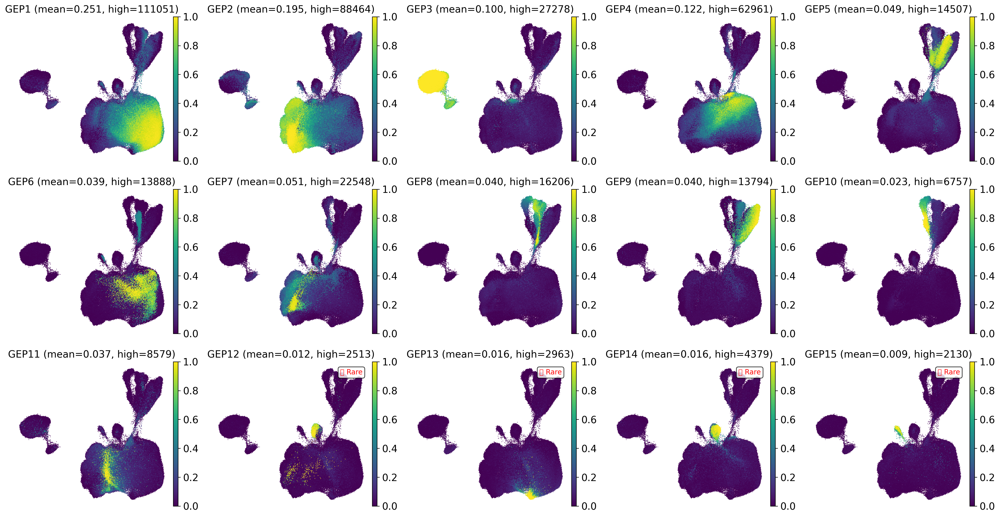


✓ GEP UMAP visualization saved: GEP_UMAP_all.png

Generating side-by-side GEP comparison...


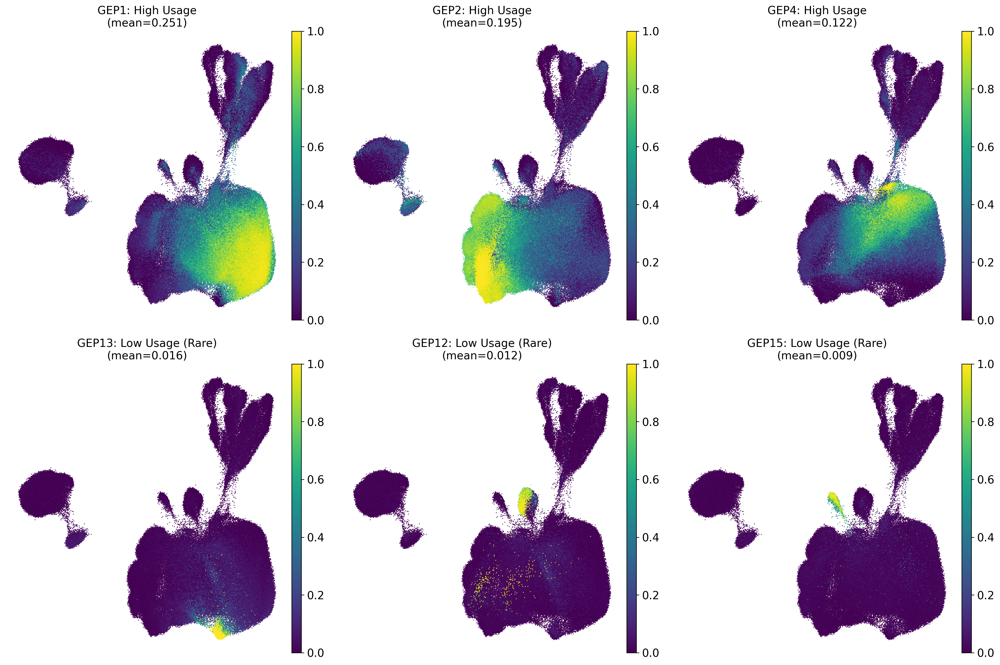

✓ GEP comparison saved: GEP_UMAP_comparison.png

GEP USAGE SUMMARY

  GEP  Mean_Usage  Std_Usage  Max_Usage  Cells_High_Usage  Pct_High_Usage
 GEP1    0.250889   0.308070   1.000000            111051       39.813215
 GEP2    0.195274   0.270189   1.000000             88464       31.715484
 GEP4    0.122275   0.196188   1.000000             62961       22.572330
 GEP3    0.099715   0.267511   1.000000             27278        9.779515
 GEP7    0.050549   0.114637   0.995294             22548        8.083749
 GEP5    0.048984   0.152582   1.000000             14507        5.200946
 GEP8    0.039698   0.119878   1.000000             16206        5.810060
 GEP9    0.039562   0.145987   1.000000             13794        4.945327
 GEP6    0.039091   0.145038   1.000000             13888        4.979027
GEP11    0.036869   0.091233   1.000000              8579        3.075682
GEP10    0.023017   0.109120   1.000000              6757        2.422472
GEP14    0.016474   0.089260   1.000000     

In [19]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

print("="*80)
print("GEP UMAP DISTRIBUTION VISUALIZATION")
print("="*80)

# Get all GEP columns
gep_cols = [f'GEP_{i}_{GEP_SUFFIX}' for i in range(1, SELECTED_K + 1)]

print(f"\nVisualizing {SELECTED_K} GEPs on UMAP...")
print("This helps understand:")
print("  - Spatial distribution of each GEP")
print("  - Which cell populations express each GEP")
print("  - Potential biological functions")

# Create figure
n_geps = len(gep_cols)
ncols = 5
nrows = int(np.ceil(n_geps / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(20, nrows*3.5))
axes = axes.flatten() if n_geps > 1 else [axes]

# Plot each GEP
for idx, gep_col in enumerate(gep_cols):
    gep_num = gep_col.replace(f'GEP_', '').replace(f'_{GEP_SUFFIX}', '')
    
    # Get usage statistics
    mean_usage = adata.obs[gep_col].mean()
    max_usage = adata.obs[gep_col].max()
    n_high = (adata.obs[gep_col] > 0.2).sum()
    
    # Plot
    sc.pl.umap(
        adata, 
        color=gep_col, 
        ax=axes[idx], 
        show=False,
        title=f'GEP{gep_num} (mean={mean_usage:.3f}, high={n_high})',
        cmap='viridis',
        frameon=False,
        s=3,
        vmin=0,
        vmax=1
    )
    
    # Add text annotation for low-usage GEPs
    if mean_usage < LOW_USAGE_GEP_THRESHOLD:
        axes[idx].text(0.95, 0.95, '⭐ Rare', 
                      transform=axes[idx].transAxes,
                      fontsize=10, color='red',
                      ha='right', va='top',
                      bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Hide extra subplots
for idx in range(n_geps, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/GEP_UMAP_all.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ GEP UMAP visualization saved: GEP_UMAP_all.png")

# ============================================================================
# Additional: Side-by-side comparison of GEPs
# ============================================================================

print("\nGenerating side-by-side GEP comparison...")

# Select interesting GEPs for detailed comparison
# Top 3 most used + Top 3 least used
gep_mean_usage = {gep: adata.obs[gep].mean() for gep in gep_cols}
sorted_geps = sorted(gep_mean_usage.items(), key=lambda x: x[1], reverse=True)

top3_high = [g[0] for g in sorted_geps[:3]]
top3_low = [g[0] for g in sorted_geps[-3:]]
selected_geps = top3_high + top3_low

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, gep_col in enumerate(selected_geps):
    gep_num = gep_col.replace(f'GEP_', '').replace(f'_{GEP_SUFFIX}', '')
    mean_usage = gep_mean_usage[gep_col]
    category = "High Usage" if gep_col in top3_high else "Low Usage (Rare)"
    
    sc.pl.umap(
        adata,
        color=gep_col,
        ax=axes[idx],
        show=False,
        title=f'GEP{gep_num}: {category}\n(mean={mean_usage:.3f})',
        cmap='viridis',
        frameon=False,
        s=5,
        vmin=0,
        vmax=1
    )

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/GEP_UMAP_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ GEP comparison saved: GEP_UMAP_comparison.png")

# ============================================================================
# Summary statistics
# ============================================================================

print("\n" + "="*80)
print("GEP USAGE SUMMARY")
print("="*80)

gep_stats = []
for gep_col in gep_cols:
    gep_num = gep_col.replace(f'GEP_', '').replace(f'_{GEP_SUFFIX}', '')
    stats_dict = {
        'GEP': f'GEP{gep_num}',
        'Mean_Usage': adata.obs[gep_col].mean(),
        'Std_Usage': adata.obs[gep_col].std(),
        'Max_Usage': adata.obs[gep_col].max(),
        'Cells_High_Usage': (adata.obs[gep_col] > 0.2).sum(),
        'Pct_High_Usage': (adata.obs[gep_col] > 0.2).sum() / adata.n_obs * 100
    }
    gep_stats.append(stats_dict)

gep_stats_df = pd.DataFrame(gep_stats)
gep_stats_df = gep_stats_df.sort_values('Mean_Usage', ascending=False)

print("\n" + gep_stats_df.to_string(index=False))

# Save statistics
gep_stats_df.to_csv(f"{OUTPUT_DIR}/GEP_usage_statistics.csv", index=False)
print(f"\n✓ Statistics saved: GEP_usage_statistics.csv")

print("\n💡 Interpretation tips:")
print("   - High mean usage (>10%) = Major cell populations")
print("   - Low mean usage (<2%) = Rare cell types or specific states")
print("   - Localized expression = Cell type-specific programs")
print("   - Dispersed expression = Pan-cellular programs (cell cycle, stress)")


GEP GENE SPECTRA VISUALIZATION (NMF-style)

Loading gene spectra from: /home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/output_complete_pipeline_v1/cnmf_results/Epithelial_HarmonyBatchCorrected/Epithelial_HarmonyBatchCorrected.gene_spectra_score.k_15.dt_0_1.txt
✓ Loaded gene spectra
  Original shape: (15, 53973)
  ⚠️  Transposing matrix (detected inverted dimensions)
  New shape: (53973, 15)
  Genes: 53,973
  GEPs: 15

Creating Top Genes Heatmap

Top 30 genes per GEP
Total unique genes: 442
Clustering genes...
Clustering GEPs...
Generating heatmap...
  Figure size: 12.0 x 35.4 inches
  Showing 442 genes × 15 GEPs


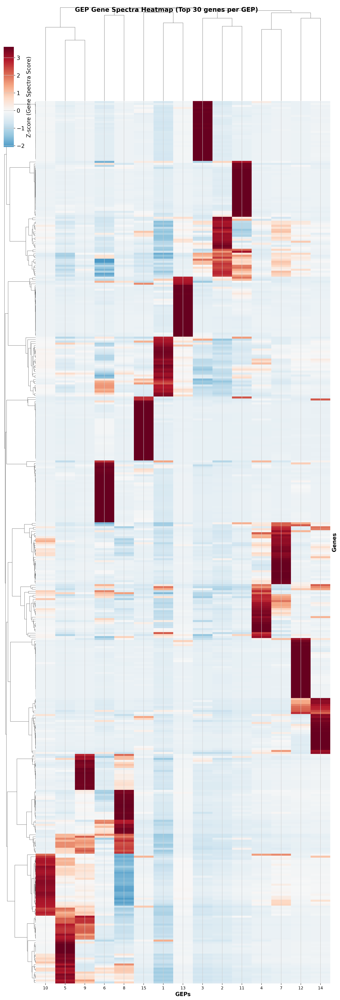

✓ Main heatmap saved: GEP_gene_spectra_heatmap.png

Creating Marker Gene Heatmap
Marker genes in gene spectra: 2/2


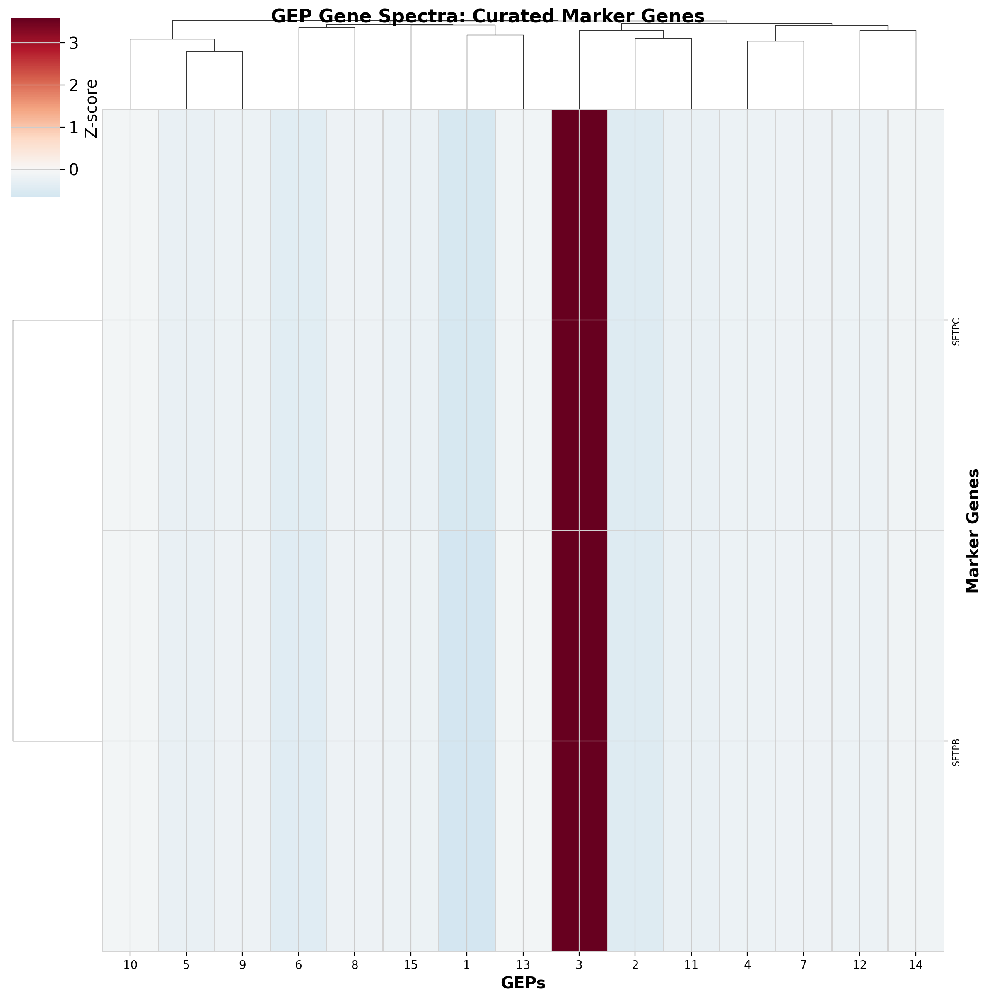

✓ Marker gene heatmap saved: GEP_marker_genes_heatmap.png

Creating GEP-GEP Correlation Matrix


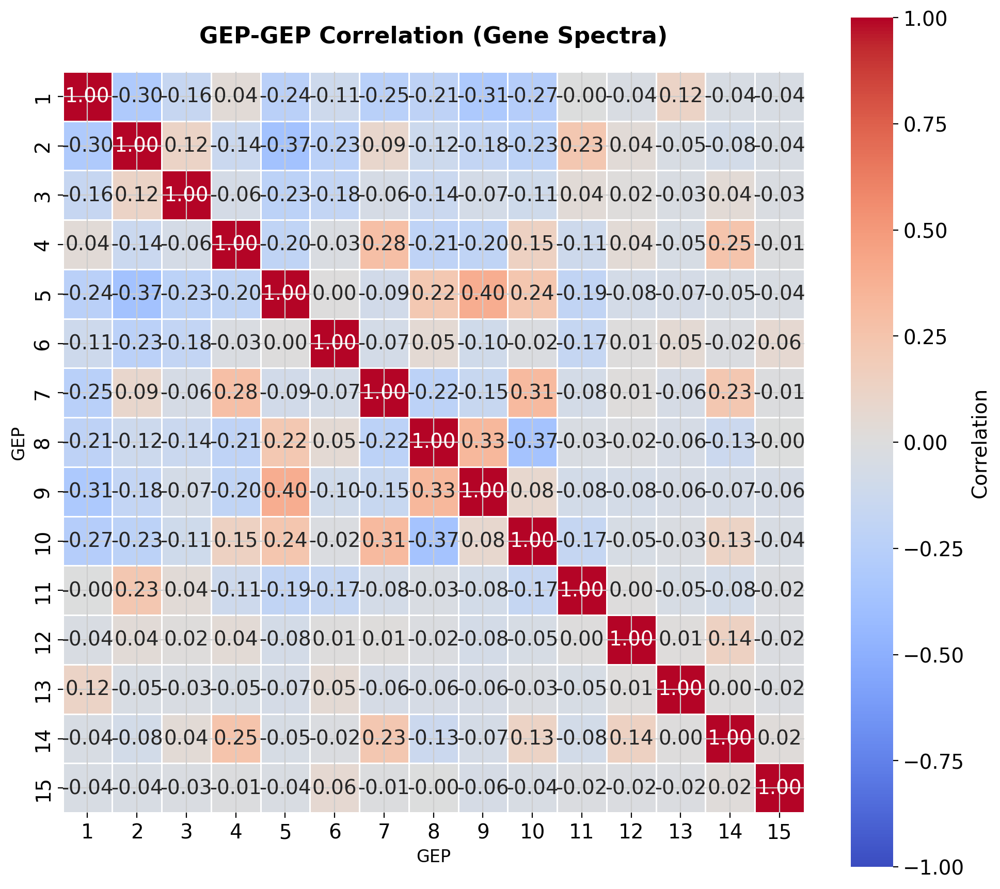

✓ Correlation matrix saved: GEP_correlation_matrix.png

Highly correlated GEP pairs (r > 0.5):
  None found (all GEPs are relatively independent)

Generating Detailed Gene Lists
✓ Detailed gene list saved: GEP_top_genes_detailed.csv

GEP biological interpretation hints:


1:
  Likely represents: Other (27/30 genes)
  Top 5 genes: LYPD2, LCN2, TMSB10, PLAAT4, S100P

2:
  Likely represents: Other (26/30 genes)
  Top 5 genes: KRT17, KRT5, RPS2, IL8, JUNB
  Other signals: Basal_resting(4)

3:
  Likely represents: Other (21/30 genes)
  Top 5 genes: SFTPC, NAPSA, SFTPA1, SFTPD, CTSH
  Other signals: AT2(7)

4:
  Likely represents: Other (25/30 genes)
  Top 5 genes: SDK1, RIMS1, SCGB1A1, ADCY2, AC007681.1

5:
  Likely represents: Other (29/30 genes)
  Top 5 genes: ENSG00000258752, ENSG00000226644, CIMIP1, CHD9NB, CCDC17

6:
  Likely represents: Other (30/30 genes)
  Top 5 genes: RPS28P7, ALOX15, RPL6P27, PTMAP2, RPL39P3

7:
  Likely represents: Other (30/30 genes)
  Top 5 genes: MIR205HG, SNH

In [21]:
# ============================================================================
# Cell A2: GEP Gene Spectra Heatmap (NMF-style) - FIXED
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage

print("="*80)
print("GEP GENE SPECTRA VISUALIZATION (NMF-style)")
print("="*80)

# Load gene spectra scores
spectra_file = f"{CNMF_DIR}/Epithelial_HarmonyBatchCorrected.gene_spectra_score.k_{SELECTED_K}.dt_0_1.txt"

print(f"\nLoading gene spectra from: {spectra_file}")

if not os.path.exists(spectra_file):
    print(f"❌ File not found: {spectra_file}")
    print("\nAlternative: gene_spectra_tpm file")
    spectra_file = spectra_file.replace('gene_spectra_score', 'gene_spectra_tpm')
    
    if not os.path.exists(spectra_file):
        print(f"❌ Also not found: {spectra_file}")
        print("\nPlease check CNMF output directory:")
        print(f"  {CNMF_DIR}")
        raise FileNotFoundError("Gene spectra file not found")

gene_spectra = pd.read_csv(spectra_file, sep='\t', index_col=0)

print(f"✓ Loaded gene spectra")
print(f"  Original shape: {gene_spectra.shape}")

# ============================================================================
# FIX: Transpose if needed (genes should be rows, GEPs should be columns)
# ============================================================================

if gene_spectra.shape[0] < gene_spectra.shape[1]:
    print(f"  ⚠️  Transposing matrix (detected inverted dimensions)")
    gene_spectra = gene_spectra.T
    print(f"  New shape: {gene_spectra.shape}")

print(f"  Genes: {gene_spectra.shape[0]:,}")
print(f"  GEPs: {gene_spectra.shape[1]}")

# ============================================================================
# 1. Top N genes per GEP heatmap (Main visualization)
# ============================================================================

print("\n" + "="*60)
print("Creating Top Genes Heatmap")
print("="*60)

TOP_N_GENES = 30  # Top genes per GEP
MAX_GENES_SHOW = 500  # Maximum total genes to show (avoid huge plots)

# Get top genes for each GEP
top_genes_per_gep = {}
all_top_genes = set()

for col in gene_spectra.columns:
    top_genes = gene_spectra[col].nlargest(TOP_N_GENES).index.tolist()
    top_genes_per_gep[col] = top_genes
    all_top_genes.update(top_genes)

print(f"\nTop {TOP_N_GENES} genes per GEP")
print(f"Total unique genes: {len(all_top_genes)}")

# Limit total genes for visualization
if len(all_top_genes) > MAX_GENES_SHOW:
    print(f"⚠️  Too many genes ({len(all_top_genes)}), limiting to {MAX_GENES_SHOW}")
    
    # Prioritize genes that appear in multiple GEPs
    gene_freq = {}
    for genes in top_genes_per_gep.values():
        for gene in genes:
            gene_freq[gene] = gene_freq.get(gene, 0) + 1
    
    # Take top N by frequency
    sorted_genes = sorted(gene_freq.items(), key=lambda x: x[1], reverse=True)
    top_genes_list = [g[0] for g in sorted_genes[:MAX_GENES_SHOW]]
    print(f"  Selected {len(top_genes_list)} most representative genes")
else:
    top_genes_list = list(all_top_genes)

# Create matrix for heatmap
heatmap_data = gene_spectra.loc[top_genes_list, :].copy()

# Z-score normalize across genes (rows)
heatmap_data_zscore = (heatmap_data.T - heatmap_data.T.mean()) / heatmap_data.T.std()
heatmap_data_zscore = heatmap_data_zscore.T

# Replace any NaN/Inf with 0
heatmap_data_zscore = heatmap_data_zscore.replace([np.inf, -np.inf], np.nan).fillna(0)

# Hierarchical clustering of genes
print("Clustering genes...")
row_linkage = linkage(heatmap_data_zscore, method='average', metric='correlation')

# Hierarchical clustering of GEPs
print("Clustering GEPs...")
col_linkage = linkage(heatmap_data_zscore.T, method='average', metric='correlation')

# Create clustermap with reasonable size
print("Generating heatmap...")

# Calculate reasonable figure size
n_genes = len(top_genes_list)
n_geps = len(gene_spectra.columns)

# Limit figure height to avoid too large images
fig_height = min(40, max(12, n_genes * 0.08))  # Max 40 inches
fig_width = min(20, max(10, n_geps * 0.8))     # Max 20 inches

print(f"  Figure size: {fig_width:.1f} x {fig_height:.1f} inches")
print(f"  Showing {n_genes} genes × {n_geps} GEPs")

g = sns.clustermap(
    heatmap_data_zscore,
    row_linkage=row_linkage,
    col_linkage=col_linkage,
    cmap='RdBu_r',
    center=0,
    figsize=(fig_width, fig_height),
    cbar_kws={'label': 'Z-score (Gene Spectra Score)'},
    xticklabels=True,
    yticklabels=True if n_genes <= 300 else False,  # Hide labels if too many
    linewidths=0,
    dendrogram_ratio=0.1,
    cbar_pos=(0.02, 0.85, 0.03, 0.1)
)

g.ax_heatmap.set_xlabel('GEPs', fontsize=14, fontweight='bold')
g.ax_heatmap.set_ylabel('Genes', fontsize=14, fontweight='bold')

if n_genes <= 300:
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=6)
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=10)

plt.suptitle(f'GEP Gene Spectra Heatmap (Top {TOP_N_GENES} genes per GEP)', 
             y=0.99, fontsize=16, fontweight='bold')

plt.savefig(f"{OUTPUT_DIR}/GEP_gene_spectra_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

print(f"✓ Main heatmap saved: GEP_gene_spectra_heatmap.png")

# ============================================================================
# 2. Focused heatmap: Marker genes only
# ============================================================================

print("\n" + "="*60)
print("Creating Marker Gene Heatmap")
print("="*60)

# Check which marker genes are in the spectra
marker_genes_available = [m for m in available_markers if m in gene_spectra.index]

print(f"Marker genes in gene spectra: {len(marker_genes_available)}/{len(available_markers)}")

if len(marker_genes_available) > 0:
    # Create marker gene heatmap
    marker_heatmap = gene_spectra.loc[marker_genes_available, :].copy()
    
    # Z-score normalize
    marker_heatmap_zscore = (marker_heatmap.T - marker_heatmap.T.mean()) / marker_heatmap.T.std()
    marker_heatmap_zscore = marker_heatmap_zscore.T
    marker_heatmap_zscore = marker_heatmap_zscore.replace([np.inf, -np.inf], np.nan).fillna(0)
    
    # Cluster
    marker_row_linkage = linkage(marker_heatmap_zscore, method='average', metric='correlation')
    
    fig_height = min(30, max(12, len(marker_genes_available) * 0.15))
    fig_width = min(20, max(10, len(gene_spectra.columns) * 0.8))
    
    g2 = sns.clustermap(
        marker_heatmap_zscore,
        row_linkage=marker_row_linkage,
        col_linkage=col_linkage,  # Use same GEP clustering
        cmap='RdBu_r',
        center=0,
        figsize=(fig_width, fig_height),
        cbar_kws={'label': 'Z-score'},
        xticklabels=True,
        yticklabels=True,
        linewidths=0.5,
        linecolor='lightgray',
        dendrogram_ratio=0.1
    )
    
    g2.ax_heatmap.set_xlabel('GEPs', fontsize=14, fontweight='bold')
    g2.ax_heatmap.set_ylabel('Marker Genes', fontsize=14, fontweight='bold')
    g2.ax_heatmap.set_yticklabels(g2.ax_heatmap.get_yticklabels(), fontsize=8)
    g2.ax_heatmap.set_xticklabels(g2.ax_heatmap.get_xticklabels(), fontsize=10)
    
    plt.suptitle('GEP Gene Spectra: Curated Marker Genes', 
                 y=0.99, fontsize=16, fontweight='bold')
    
    plt.savefig(f"{OUTPUT_DIR}/GEP_marker_genes_heatmap.png", dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    print(f"✓ Marker gene heatmap saved: GEP_marker_genes_heatmap.png")
else:
    print("⚠️ No marker genes found in gene spectra")

# ============================================================================
# 3. GEP-GEP correlation matrix
# ============================================================================

print("\n" + "="*60)
print("Creating GEP-GEP Correlation Matrix")
print("="*60)

# Calculate correlation between GEPs based on their gene spectra
gep_correlation = gene_spectra.corr()

fig, ax = plt.subplots(figsize=(10, 9))

sns.heatmap(
    gep_correlation,
    cmap='coolwarm',
    center=0,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt='.2f',
    square=True,
    linewidths=0.5,
    cbar_kws={'label': 'Correlation'},
    ax=ax
)

ax.set_title('GEP-GEP Correlation (Gene Spectra)', fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel('GEP', fontsize=12)
ax.set_ylabel('GEP', fontsize=12)

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/GEP_correlation_matrix.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

print(f"✓ Correlation matrix saved: GEP_correlation_matrix.png")

# Identify highly correlated GEPs
print("\nHighly correlated GEP pairs (r > 0.5):")
high_corr_count = 0
for i in range(len(gep_correlation.columns)):
    for j in range(i+1, len(gep_correlation.columns)):
        corr = gep_correlation.iloc[i, j]
        if corr > 0.5:
            gep1 = gep_correlation.columns[i]
            gep2 = gep_correlation.columns[j]
            print(f"  {gep1} <-> {gep2}: r = {corr:.3f}")
            high_corr_count += 1

if high_corr_count == 0:
    print("  None found (all GEPs are relatively independent)")

# ============================================================================
# 4. Detailed gene list per GEP with categories
# ============================================================================

print("\n" + "="*60)
print("Generating Detailed Gene Lists")
print("="*60)

# Categorize genes by cell type
def categorize_gene(gene):
    """Categorize gene into cell type based on marker dictionary"""
    for cat_name, markers in MARKER_GENES.items():
        if gene in markers:
            return cat_name
    return 'Other'

# For each GEP, get top genes with categories
gep_gene_details = []

for col in gene_spectra.columns:
    gep_num = col
    top_genes_full = gene_spectra[col].nlargest(50)
    
    for rank, (gene, score) in enumerate(top_genes_full.items(), 1):
        category = categorize_gene(gene)
        
        gep_gene_details.append({
            'GEP': gep_num,
            'Rank': rank,
            'Gene': gene,
            'Score': score,
            'Category': category
        })

gep_gene_df = pd.DataFrame(gep_gene_details)
gep_gene_df.to_csv(f"{OUTPUT_DIR}/GEP_top_genes_detailed.csv", index=False)

print(f"✓ Detailed gene list saved: GEP_top_genes_detailed.csv")

# Summary by GEP
print("\nGEP biological interpretation hints:")
print("\n" + "="*80)

for col in gene_spectra.columns:
    gep_num = col
    gep_genes = gep_gene_df[gep_gene_df['GEP'] == gep_num]
    
    # Count categories in top 30
    top30 = gep_genes.head(30)
    cat_counts = top30['Category'].value_counts()
    
    # Get top category
    if len(cat_counts) > 0 and cat_counts.iloc[0] > 3:  # At least 3 genes in top category
        top_cat = cat_counts.index[0]
        top_cat_count = cat_counts.iloc[0]
        
        print(f"\n{gep_num}:")
        print(f"  Likely represents: {top_cat} ({top_cat_count}/30 genes)")
        print(f"  Top 5 genes: {', '.join(top30.head(5)['Gene'].tolist())}")
        
        # Show all categories with >2 genes
        other_cats = cat_counts[cat_counts > 2]
        if len(other_cats) > 1:
            print(f"  Other signals: {', '.join([f'{cat}({cnt})' for cat, cnt in other_cats.items() if cat != top_cat])}")
    else:
        print(f"\n{gep_num}:")
        print(f"  Mixed/unclear signature")
        print(f"  Top 5 genes: {', '.join(top30.head(5)['Gene'].tolist())}")

# ============================================================================
# Summary
# ============================================================================

print("\n" + "="*80)
print("GEP GENE SPECTRA ANALYSIS COMPLETE")
print("="*80)

print(f"\n📁 Generated files:")
print(f"   1. GEP_gene_spectra_heatmap.png - Main NMF-style heatmap")
print(f"   2. GEP_marker_genes_heatmap.png - Marker genes focus")
print(f"   3. GEP_correlation_matrix.png - GEP-GEP correlation")
print(f"   4. GEP_top_genes_detailed.csv - Complete gene lists")

print(f"\n💡 How to use these for annotation:")
print(f"   1. Check GEP UMAP (Cell A1) - spatial distribution")
print(f"   2. Check gene spectra heatmap (Cell A2) - biological function")
print(f"   3. Match GEP patterns to clusters (from GEP-cluster heatmap)")
print(f"   4. Use biological interpretation to guide manual annotation")

print(f"\n✅ Ready to start manual annotation!")
print("   Use GEP biological interpretations to inform your Manual_Annotation column")

In [26]:
# ============================================================================
# Cell A3: Interactive GEP Explorer (FIXED)
# ============================================================================

import pandas as pd

print("="*80)
print("INTERACTIVE GEP GENE EXPLORER")
print("="*80)

def explore_gep(gep_number, n_genes=50):
    """
    Explore a specific GEP in detail
    
    Parameters:
    -----------
    gep_number : int
        GEP number (1 to SELECTED_K)
    n_genes : int
        Number of top genes to show
    """
    # Try different column name formats
    col_name = None
    possible_names = [str(gep_number), f'{gep_number}', gep_number]
    
    for name in possible_names:
        if name in gene_spectra.columns:
            col_name = name
            break
    
    if col_name is None:
        print(f"❌ GEP {gep_number} not found")
        print(f"Available GEPs: {', '.join(map(str, sorted([str(c) for c in gene_spectra.columns])))}")
        print(f"Column names type: {type(gene_spectra.columns[0])}")
        return
    
    print(f"\n{'='*80}")
    print(f"GEP {gep_number} DETAILED ANALYSIS")
    print(f"{'='*80}")
    
    # Get top genes
    top_genes = gene_spectra[col_name].nlargest(n_genes)
    
    # Usage statistics
    gep_col = f'GEP_{gep_number}_{GEP_SUFFIX}'
    if gep_col not in adata.obs.columns:
        print(f"⚠️  Warning: {gep_col} not found in adata.obs")
        mean_usage = 0
        high_cells = 0
    else:
        mean_usage = adata.obs[gep_col].mean()
        high_cells = (adata.obs[gep_col] > 0.2).sum()
    
    print(f"\n📊 Usage Statistics:")
    print(f"   Mean usage: {mean_usage:.3f}")
    print(f"   Cells with high usage (>0.2): {high_cells:,} ({high_cells/adata.n_obs*100:.2f}%)")
    
    # Which clusters use this GEP
    if gep_col in adata.obs.columns:
        cluster_usage = adata.obs.groupby(CLUSTER_KEY)[gep_col].mean().sort_values(ascending=False)
        print(f"\n🎯 Top 5 clusters using this GEP:")
        for cluster, usage in cluster_usage.head(5).items():
            n_cells = (adata.obs[CLUSTER_KEY] == cluster).sum()
            print(f"   Cluster {cluster}: usage={usage:.3f} ({n_cells:,} cells)")
    
    # Categorize top genes
    print(f"\n🧬 Top {n_genes} genes:")
    print(f"\n{'Rank':<5} {'Gene':<15} {'Score':<10} {'Category':<25}")
    print("-"*60)
    
    for rank, (gene, score) in enumerate(top_genes.items(), 1):
        category = categorize_gene(gene)
        print(f"{rank:<5} {gene:<15} {score:<10.4f} {category:<25}")
    
    # Category summary
    categories = [categorize_gene(g) for g in top_genes.index]
    cat_counts = pd.Series(categories).value_counts()
    
    print(f"\n📋 Category Summary (top {n_genes}):")
    for cat, count in cat_counts.items():
        pct = count / n_genes * 100
        print(f"   {cat:<25} {count:>3} ({pct:>5.1f}%)")
    
    # Biological interpretation
    print(f"\n💡 Likely Biological Function:")
    if cat_counts.iloc[0] > n_genes * 0.3:  # If top category >30%
        top_cat = cat_counts.index[0]
        print(f"   Primary: {top_cat}")
        if len(cat_counts) > 1 and cat_counts.iloc[1] > n_genes * 0.15:
            print(f"   Secondary: {cat_counts.index[1]}")
    else:
        print(f"   Mixed signature or transition state")
    
    # Show top genes in a more readable format
    print(f"\n📝 Top 10 genes (for quick reference):")
    print(f"   {', '.join(top_genes.head(10).index.tolist())}")
    
    return top_genes


def explore_all_geps_summary():
    """Generate a quick summary of all GEPs"""
    print("\n" + "="*80)
    print("QUICK SUMMARY OF ALL GEPs")
    print("="*80)
    
    print(f"\n{'GEP':<5} {'Mean Usage':<12} {'High Cells':<12} {'Top 3 Genes':<60}")
    print("-"*90)
    
    for gep_num in range(1, SELECTED_K + 1):
        # Get column name
        col_name = None
        for name in [str(gep_num), gep_num]:
            if name in gene_spectra.columns:
                col_name = name
                break
        
        if col_name is None:
            continue
        
        # Get top genes
        top3_genes = gene_spectra[col_name].nlargest(3).index.tolist()
        
        # Get usage
        gep_col = f'GEP_{gep_num}_{GEP_SUFFIX}'
        if gep_col in adata.obs.columns:
            mean_usage = adata.obs[gep_col].mean()
            high_cells = (adata.obs[gep_col] > 0.2).sum()
        else:
            mean_usage = 0
            high_cells = 0
        
        # Format
        genes_str = ', '.join(top3_genes)
        print(f"{gep_num:<5} {mean_usage:<12.3f} {high_cells:<12,} {genes_str:<60}")
    
    print("\n💡 Quick interpretation:")
    print("   - High mean usage (>10%) = Major populations")
    print("   - Low mean usage (<2%) = Rare cells")
    print("   - Check top genes to understand biological function")


# Example usage with proper column handling
print("\n" + "="*60)
print("EXPLORING SPECIFIC GEPs")
print("="*60)

# Explore a high-usage GEP
print("\n" + "="*60)
print("Example 1: High-usage GEP (GEP 1)")
print("="*60)
explore_gep(1, n_genes=30)

# Explore a low-usage GEP (likely rare cells)
print("\n\n" + "="*60)
print("Example 2: Low-usage GEP (GEP 15 - likely rare cells)")
print("="*60)
explore_gep(15, n_genes=30)

# Generate summary
print("\n")
explore_all_geps_summary()

print("\n" + "="*80)
print("💡 How to use:")
print("="*80)
print("   explore_gep(gep_number, n_genes=50)")
print("\nExamples:")
print("   explore_gep(2)       # Explore GEP 2 with 50 genes")
print("   explore_gep(13, 30)  # Explore GEP 13 with 30 genes")
print("   explore_gep(3)       # Explore GEP 3 (AT2 cells)")
print("\n   explore_all_geps_summary()  # Quick overview of all GEPs")

print("\n✅ Interactive GEP explorer ready!")
print("   Use explore_gep() to investigate any GEP before annotation")

INTERACTIVE GEP GENE EXPLORER

EXPLORING SPECIFIC GEPs

Example 1: High-usage GEP (GEP 1)

GEP 1 DETAILED ANALYSIS

📊 Usage Statistics:
   Mean usage: 0.251
   Cells with high usage (>0.2): 111,051 (39.81%)

🎯 Top 5 clusters using this GEP:
   Cluster 2: usage=0.779 (18,213 cells)
   Cluster 22: usage=0.709 (3,913 cells)
   Cluster 5: usage=0.685 (14,632 cells)
   Cluster 10: usage=0.631 (12,220 cells)
   Cluster 13: usage=0.606 (10,604 cells)

🧬 Top 30 genes:

Rank  Gene            Score      Category                 
------------------------------------------------------------
1     LYPD2           0.0029     Club_nasal               
2     LCN2            0.0027     Other                    
3     TMSB10          0.0025     Other                    
4     PLAAT4          0.0025     Other                    
5     S100P           0.0024     Other                    
6     PSCA            0.0024     Other                    
7     SAT1            0.0022     Other                    
8

# Cell 1: Generate Annotation Template for Manual Editing

In [25]:
import pandas as pd

# Load the automated suggestions if not already in memory
if 'annotation_df' not in locals():
    annotation_df = pd.read_csv(f"{OUTPUT_DIR}/annotation_suggestions_with_QC.csv")

# Create annotation template
annotation_template = annotation_df[[
    'Cluster', 
    'Size', 
    'Percent',
    'Suggestion', 
    'Confidence',
    'Dominant_GEP',
    'Warnings'
]].copy()

# Add columns for manual annotation
annotation_template['Manual_Annotation'] = ''
annotation_template['Notes'] = ''
annotation_template['Status'] = 'Pending'  # Pending/Confirmed/Unknown/Skip

# Add helper columns
annotation_template['Top_Markers'] = ''  # Will fill with observed markers

# For each cluster, get top expressed markers
print("Adding top markers for each cluster...")
for idx, row in annotation_template.iterrows():
    cluster = row['Cluster']
    cluster_cells = adata[adata.obs[CLUSTER_KEY] == cluster]
    
    # Calculate mean expression for curated markers
    marker_expr = {}
    for marker in available_markers[:50]:  # Top 50 markers only
        if marker in adata.var_names:
            if 'log1p' in adata.layers:
                expr = cluster_cells[:, marker].layers['log1p'].mean()
            else:
                expr = cluster_cells[:, marker].X.mean()
            marker_expr[marker] = expr
    
    # Get top 5
    top_markers = sorted(marker_expr.items(), key=lambda x: x[1], reverse=True)[:5]
    marker_str = ', '.join([f"{m}({v:.2f})" for m, v in top_markers])
    annotation_template.at[idx, 'Top_Markers'] = marker_str

# Sort by size (largest first for easier annotation)
annotation_template = annotation_template.sort_values('Size', ascending=False)

# Save template
template_path = f"{OUTPUT_DIR}/annotation_template.csv"
annotation_template.to_csv(template_path, index=False)

print("="*80)
print("ANNOTATION TEMPLATE GENERATED")
print("="*80)
print(f"\n✓ Saved to: {template_path}")
print(f"\nNext steps:")
print(f"1. Open the CSV file in Excel/LibreOffice")
print(f"2. Fill in the 'Manual_Annotation' column:")
print(f"   - For high confidence: copy from 'Suggestion' or refine")
print(f"   - For moderate/low: check Top_Markers and GEP top genes")
print(f"   - For uncertain: leave empty or mark 'Unknown'")
print(f"3. Update 'Status' column:")
print(f"   - 'Confirmed': confident annotation")
print(f"   - 'Unknown': truly uncertain, scANVI will help")
print(f"   - 'Skip': exclude from training (e.g., doublets)")
print(f"4. Add notes if needed")
print(f"5. Save as: annotation_template_MANUAL.csv")
print(f"\n" + "="*80)

# Show preview
print("\nPreview (first 10 clusters):")
print(annotation_template.head(10)[['Cluster', 'Size', 'Suggestion', 'Confidence', 'Warnings']].to_string(index=False))

print("\n💡 Tips:")
print("   - Start with largest clusters (easier to identify)")
print("   - Use 'Unknown' for ambiguous clusters (scANVI will refine)")
print("   - Skip very small clusters (<100 cells) if uncertain")
print("   - Check batch-dominated clusters carefully")



Adding top markers for each cluster...
ANNOTATION TEMPLATE GENERATED

✓ Saved to: /home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/annotation_results/annotation_template.csv

Next steps:
1. Open the CSV file in Excel/LibreOffice
2. Fill in the 'Manual_Annotation' column:
   - For high confidence: copy from 'Suggestion' or refine
   - For moderate/low: check Top_Markers and GEP top genes
   - For uncertain: leave empty or mark 'Unknown'
3. Update 'Status' column:
   - 'Confirmed': confident annotation
   - 'Unknown': truly uncertain, scANVI will help
   - 'Skip': exclude from training (e.g., doublets)
4. Add notes if needed
5. Save as: annotation_template_MANUAL.csv


Preview (first 10 clusters):
Cluster  Size           Suggestion Confidence Warnings
      0 20107 Unknown (Secretory?)        Low     None
      1 19943                Basal       High     None
      2 18213               Goblet       High     None
      3 15054    Unknown (Goblet?)        Low     None
      4 1

# Cell 2: Load Manual Annotations and Apply to AnnData

In [32]:
# ============================================================================
# Cell 2: Load and Apply Manual Annotations - ROBUST FIX
# ============================================================================

import pandas as pd
import numpy as np

print("="*80)
print("LOAD AND APPLY MANUAL ANNOTATIONS")
print("="*80)

# ============================================================================
# Configuration
# ============================================================================

ANNOTATION_FILE = os.path.join(OUTPUT_DIR, "annotation_template_MANUAL.csv")

# ============================================================================
# Load manual annotations
# ============================================================================

print(f"\nLoading manual annotations...")

if not os.path.exists(ANNOTATION_FILE):
    raise FileNotFoundError(
        f"Manual annotation file not found: {ANNOTATION_FILE}\n"
        f"Please complete annotation_template.csv and save as annotation_template_MANUAL.csv"
    )

annot_df = pd.read_csv(ANNOTATION_FILE)
print(f"✓ Loaded from: {ANNOTATION_FILE}")

# ============================================================================
# ROBUST FIX: Clean and standardize cluster IDs
# ============================================================================

print(f"\nCleaning cluster IDs...")

# 1. Convert to string and strip whitespace
annot_df['Cluster'] = annot_df['Cluster'].astype(str).str.strip()

# 2. Also strip Manual_Annotation and Status
annot_df['Manual_Annotation'] = annot_df['Manual_Annotation'].astype(str).str.strip()
annot_df['Status'] = annot_df['Status'].astype(str).str.strip()

# 3. Handle adata clusters
if adata.obs[CLUSTER_KEY].dtype.name == 'category':
    adata.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].astype(str)
else:
    adata.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].astype(str)

# Strip whitespace from adata clusters too
adata.obs[CLUSTER_KEY] = adata.obs[CLUSTER_KEY].str.strip()

print(f"✓ Cluster IDs cleaned and standardized")

# Debug: Check for exact matches
annot_clusters = set(annot_df['Cluster'].unique())
adata_clusters = set(adata.obs[CLUSTER_KEY].unique())

print(f"\n  Clusters in annotation: {len(annot_clusters)}")
print(f"  Clusters in adata: {len(adata_clusters)}")
print(f"  Common clusters: {len(annot_clusters & adata_clusters)}")

if len(annot_clusters) != len(adata_clusters):
    missing_in_annot = adata_clusters - annot_clusters
    missing_in_adata = annot_clusters - adata_clusters
    if missing_in_annot:
        print(f"  ⚠️  Clusters in adata but not in annotation: {sorted(missing_in_annot)}")
    if missing_in_adata:
        print(f"  ⚠️  Clusters in annotation but not in adata: {sorted(missing_in_adata)}")

# ============================================================================
# Validate annotation file
# ============================================================================

print(f"\n{'='*60}")
print("ANNOTATION VALIDATION")
print("="*60)

# Check required columns
required_cols = ['Cluster', 'Manual_Annotation', 'Status']
missing_cols = [col for col in required_cols if col not in annot_df.columns]

if missing_cols:
    raise ValueError(f"Missing required columns: {missing_cols}")

# Remove any rows with NaN in key columns
before_drop = len(annot_df)
annot_df = annot_df.dropna(subset=['Cluster', 'Manual_Annotation', 'Status'])
after_drop = len(annot_df)

if before_drop != after_drop:
    print(f"  Removed {before_drop - after_drop} rows with NaN values")

# Check for empty Manual_Annotation in Confirmed rows
confirmed_rows = annot_df[annot_df['Status'] == 'Confirmed']
empty_annotations = confirmed_rows[
    (confirmed_rows['Manual_Annotation'] == '') |
    (confirmed_rows['Manual_Annotation'] == 'nan')
]

if len(empty_annotations) > 0:
    print(f"\n⚠️  WARNING: {len(empty_annotations)} 'Confirmed' clusters have empty Manual_Annotation:")
    for idx, row in empty_annotations.iterrows():
        print(f"  - Cluster {row['Cluster']}")
    raise ValueError("Please fill Manual_Annotation for all Confirmed clusters")

# Check for invalid Status values
valid_statuses = ['Confirmed', 'Unknown', 'Skip']
invalid_status = annot_df[~annot_df['Status'].isin(valid_statuses)]

if len(invalid_status) > 0:
    print(f"\n⚠️  WARNING: {len(invalid_status)} clusters have invalid Status:")
    for idx, row in invalid_status.iterrows():
        print(f"  - Cluster {row['Cluster']}: '{row['Status']}'")
    print(f"  Valid values: {valid_statuses}")
    raise ValueError("Please use valid Status values")

# Summary by Status
status_counts = annot_df['Status'].value_counts()
print(f"\nAnnotation summary:")
for status in ['Confirmed', 'Unknown', 'Skip']:
    count = status_counts.get(status, 0)
    print(f"  {status}: {count} clusters")

print(f"\n✓ Validation passed")

# ============================================================================
# Apply annotations using MERGE (more robust than map)
# ============================================================================

print(f"\n{'='*60}")
print("APPLYING ANNOTATIONS")
print("="*60)

print(f"\nUsing merge method for robust mapping...")

# Create a temporary dataframe with cluster info
cluster_df = pd.DataFrame({
    CLUSTER_KEY: adata.obs[CLUSTER_KEY]
})

# Merge with annotations
merged = cluster_df.merge(
    annot_df[['Cluster', 'Manual_Annotation', 'Status']],
    left_on=CLUSTER_KEY,
    right_on='Cluster',
    how='left'
)

# Check for unmapped
unmapped = merged['Manual_Annotation'].isna().sum()

if unmapped > 0:
    unmapped_clusters = cluster_df[merged['Manual_Annotation'].isna()][CLUSTER_KEY].unique()
    print(f"\n❌ ERROR: {unmapped} cells from {len(unmapped_clusters)} clusters have no annotation:")
    print(f"  Unmapped clusters: {sorted(unmapped_clusters)}")
    
    # Detailed debugging
    print(f"\n  Debugging cluster mismatch:")
    for cluster in sorted(unmapped_clusters)[:5]:  # Show first 5
        # Check if cluster exists in annotation
        match = annot_df[annot_df['Cluster'] == cluster]
        print(f"    Cluster '{cluster}' (len={len(cluster)}, repr={repr(cluster)})")
        if len(match) > 0:
            print(f"      Found in annot_df: {match['Manual_Annotation'].values[0]}")
        else:
            print(f"      NOT found in annot_df")
            # Try to find similar
            similar = annot_df[annot_df['Cluster'].str.contains(cluster.strip())]
            if len(similar) > 0:
                print(f"      Similar clusters: {similar['Cluster'].tolist()}")
    
    raise ValueError("Mapping failed - see debug output above")

# Apply to adata
adata.obs['cell_type_manual'] = merged['Manual_Annotation'].values
adata.obs['annotation_status'] = merged['Status'].values

print(f"✓ Annotations applied to all {adata.n_obs:,} cells")

# ============================================================================
# Display annotation distribution
# ============================================================================

print(f"\n{'='*60}")
print("ANNOTATION DISTRIBUTION")
print("="*60)

type_counts = adata.obs['cell_type_manual'].value_counts()

print(f"\n{'Type':<35} {'Cells':<12} {'Percent':<10}")
print("-"*60)
for cell_type, count in type_counts.items():
    pct = count / adata.n_obs * 100
    print(f"{cell_type:<35} {count:<12,} {pct:<10.2f}%")

# ============================================================================
# Training set statistics (FIXED)
# ============================================================================

print(f"\n{'='*60}")
print("TRAINING SET STATISTICS")
print("="*60)

# Correct logic: Look at cell_type_manual values
n_labeled = (
    (adata.obs['cell_type_manual'] != 'Unknown') & 
    (adata.obs['cell_type_manual'] != 'Skip')
).sum()

n_unlabeled = (adata.obs['cell_type_manual'] == 'Unknown').sum()
n_excluded = (adata.obs['cell_type_manual'] == 'Skip').sum()
n_total = adata.n_obs

print(f"\nTotal cells: {n_total:,}")
print(f"\nBreakdown:")
print(f"  Labeled (for training): {n_labeled:,} ({n_labeled/n_total*100:.1f}%)")
print(f"  Unlabeled (to predict): {n_unlabeled:,} ({n_unlabeled/n_total*100:.1f}%)")
print(f"  Excluded (Skip): {n_excluded:,} ({n_excluded/n_total*100:.1f}%)")

# Sanity check
assert n_labeled + n_unlabeled + n_excluded == n_total, "Cell counts don't add up!"

# Quality assessment
print(f"\n{'='*60}")
if n_labeled < n_total * 0.3:
    print(f"⚠️  WARNING: Only {n_labeled/n_total*100:.1f}% cells are labeled")
    print(f"   Recommendation: Label at least 50% for good scANVI performance")
elif n_labeled < n_total * 0.5:
    print(f"⚠️  Moderate: {n_labeled/n_total*100:.1f}% cells labeled")
    print(f"   Should work, but >50% is better")
else:
    print(f"✓ Good: {n_labeled/n_total*100:.1f}% cells labeled")

# ============================================================================
# Show labeled cell type distribution
# ============================================================================

if n_labeled > 0:
    print(f"\n{'='*60}")
    print("LABELED CELL TYPES (For Training)")
    print("="*60)
    
    labeled_mask = (
        (adata.obs['cell_type_manual'] != 'Unknown') & 
        (adata.obs['cell_type_manual'] != 'Skip')
    )
    labeled_cells = adata.obs[labeled_mask]
    labeled_type_counts = labeled_cells['cell_type_manual'].value_counts()
    
    print(f"\n{'Cell Type':<30} {'Count':<12} {'% of Labeled':<15} {'% of Total':<10}")
    print("-"*70)
    for cell_type, count in labeled_type_counts.items():
        pct_labeled = count / n_labeled * 100
        pct_total = count / n_total * 100
        print(f"{cell_type:<30} {count:<12,} {pct_labeled:<15.2f}% {pct_total:<10.2f}%")
    
    # Check for very rare cell types in training set
    rare_types = labeled_type_counts[labeled_type_counts < 100]
    if len(rare_types) > 0:
        print(f"\n⚠️  Cell types with <100 labeled cells (may have low prediction confidence):")
        for cell_type, count in rare_types.items():
            print(f"   - {cell_type}: {count} cells")

# ============================================================================
# Verify annotation status consistency
# ============================================================================

print(f"\n{'='*60}")
print("ANNOTATION STATUS CHECK")
print("="*60)

status_cell_counts = adata.obs['annotation_status'].value_counts()
print(f"\nCells by annotation status:")
for status in ['Confirmed', 'Unknown', 'Skip']:
    count = status_cell_counts.get(status, 0)
    pct = count / n_total * 100
    print(f"  {status}: {count:,} cells ({pct:.1f}%)")

# ============================================================================
# Save checkpoint
# ============================================================================

checkpoint_file = os.path.join(OUTPUT_DIR, "adata_with_manual_annotations.h5ad")
print(f"\n{'='*60}")
print(f"Saving annotated data...")
print(f"File: {checkpoint_file}")
adata.write_h5ad(checkpoint_file)
print(f"✓ Saved")

# ============================================================================
# Final summary
# ============================================================================

print(f"\n{'='*80}")
print(f"✓ MANUAL ANNOTATIONS APPLIED SUCCESSFULLY")
print(f"{'='*80}")

print(f"\n📊 Final Summary:")
print(f"   Total cells: {n_total:,}")
print(f"   Labeled (for training): {n_labeled:,} ({n_labeled/n_total*100:.1f}%)")
print(f"   Unknown (to predict): {n_unlabeled:,} ({n_unlabeled/n_total*100:.1f}%)")
print(f"   Excluded (Skip): {n_excluded:,} ({n_excluded/n_total*100:.1f}%)")
print(f"   Unique cell types: {len(labeled_type_counts)} (excluding Unknown/Skip)")

print(f"\n✅ Ready for scVI/scANVI training!")
print(f"\nNext: Switch to scvi environment and run scANVI notebook")

LOAD AND APPLY MANUAL ANNOTATIONS

Loading manual annotations...
✓ Loaded from: /home/h2048/data/py/1206/bbknn_celltype_analysis/Epithelial/annotation_results/annotation_template_MANUAL.csv

Cleaning cluster IDs...
✓ Cluster IDs cleaned and standardized

  Clusters in annotation: 29
  Clusters in adata: 29
  Common clusters: 29

ANNOTATION VALIDATION

Annotation summary:
  Confirmed: 20 clusters
  Unknown: 9 clusters
  Skip: 0 clusters

✓ Validation passed

APPLYING ANNOTATIONS

Using merge method for robust mapping...
✓ Annotations applied to all 278,930 cells

ANNOTATION DISTRIBUTION

Type                                Cells        Percent   
------------------------------------------------------------
nan                                 88,626       31.77     %
Basal                               65,945       23.64     %
Goblet                              53,504       19.18     %
Ciliated                            37,260       13.36     %
AT2                                 23,29